# Chapter 1. Network analysis of liver expression data from female mice: finding modules related to body weight

构建基因表达网络，其流程如下图所示：


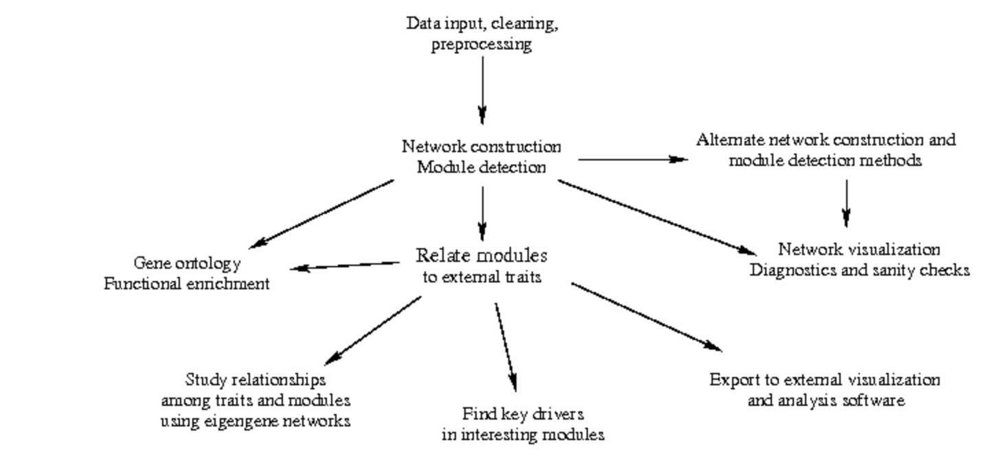

## 1.1 数据的导入和处理

这一步非常重要，这将告诉我们需要将我们的数据处理成什么格式，以便于后续实验操作，所以请务必认真学习作者如何将自己的数据一步一步处理成为后续分析的数据，以及学习后续分析的数据应该遵循什么样子的格式，我们处理我们自己的数据的最终形态。

### 1.1.a 加载表达数据

表达数据包括在LiverFemale3600.csv之中，不过在教程开始之前，我们需要加载R包，并且导入我们的数据，且制定我们的工作路径

In [1]:
# 显示目前的工作路径
getwd()

[1] "/Users/dr.chang/Desktop/learning/WGCNA_analysis/work"

目前的工作路径没问题，所以我们不需要修改，当我们需要修改我们的工作路径时，可以用以下代码

In [2]:
#首先导入自己的工作路径，在windows电脑中，复制的工作路径中\应该替代为/，记得换个方向
workingDir = '/Users/dr.chang/Desktop/learning/WGCNA_analysis/work'
setwd(workingDir) #这一步就是设立自己的工作路径，其中setwd就是改变工作路径的函数，workingDir只是一个包含有工作路径的向量

In [3]:
#加载WGCNA包，利用library函数
library(WGCNA)

载入需要的程辑包：dynamicTreeCut

载入需要的程辑包：fastcluster


载入程辑包：‘fastcluster’


The following object is masked from ‘package:stats’:

    hclust





载入程辑包：‘WGCNA’


The following object is masked from ‘package:stats’:

    cor




In [4]:
#加载成功后，要将自动转换为因子的设置关掉，因为R会自动将字符串向量转变为因子向量，在这里我们不需要这个功能
options(stringAsFactors = F)

In [6]:
#读取我们的female liver矩阵
femData = read.csv("../data/LiverFemale3600.csv")#这里注意我的读取路径，因为我的female文件和我的工作路径不在一个文件夹下，因此我加了../data/来制定文件夹

In [7]:
#可以快速看一下我们的female liver文件长什么样子
dim(femData) #female liver文件的行数和列数，第一个为行，第二个为列
names(femData) #female liver文件的列名都是什么

[1] 3600  143

[1] "substanceBXH"   "gene_symbol"    "LocusLinkID"    "ProteomeID"    
  [5] "cytogeneticLoc" "CHROMOSOME"     "StartPosition"  "EndPosition"   
  [9] "F2_2"           "F2_3"           "F2_14"          "F2_15"         
 [13] "F2_19"          "F2_20"          "F2_23"          "F2_24"         
 [17] "F2_26"          "F2_37"          "F2_42"          "F2_43"         
 [21] "F2_45"          "F2_46"          "F2_47"          "F2_48"         
 [25] "F2_51"          "F2_52"          "F2_54"          "F2_63"         
 [29] "F2_65"          "F2_66"          "F2_68"          "F2_69"         
 [33] "F2_70"          "F2_71"          "F2_72"          "F2_78"         
 [37] "F2_79"          "F2_80"          "F2_81"          "F2_83"         
 [41] "F2_86"          "F2_87"          "F2_88"          "F2_89"         
 [45] "F2_107"         "F2_108"         "F2_109"         "F2_110"        
 [49] "F2_111"         "F2_112"         "F2_117"         "F2_119"        
 [53] "F2_125"         "F2_126"         "F2_127"         "F2_141"        
 [57] "F2_142"         "F2_143"         "F2_144"         "F2_145"        
 [61] "F2_154"         "F2_155"         "F2_156"         "F2_157"        
 [65] "F2_162"         "F2_163"         "F2_164"         "F2_165"        
 [69] "F2_166"         "F2_167"         "F2_169"         "F2_180"        
 [73] "F2_181"         "F2_182"         "F2_187"         "F2_188"        
 [77] "F2_189"         "F2_190"         "F2_191"         "F2_192"        
 [81] "F2_194"         "F2_195"         "F2_200"         "F2_201"        
 [85] "F2_212"         "F2_213"         "F2_214"         "F2_215"        
 [89] "F2_221"         "F2_222"         "F2_223"         "F2_224"        
 [93] "F2_225"         "F2_226"         "F2_227"         "F2_228"        
 [97] "F2_241"         "F2_242"         "F2_243"         "F2_244"        
[101] "F2_245"         "F2_247"         "F2_248"         "F2_261"        
[105] "F2_263"         "F2_264"         "F2_270"         "F2_271"        
[109] "F2_272"         "F2_278"         "F2_287"         "F2_288"        
[113] "F2_289"         "F2_290"         "F2_291"         "F2_296"        
[117] "F2_298"         "F2_299"         "F2_300"         "F2_302"        
[121] "F2_303"         "F2_304"         "F2_305"         "F2_306"        
[125] "F2_307"         "F2_308"         "F2_309"         "F2_310"        
[129] "F2_311"         "F2_312"         "F2_320"         "F2_321"        
[133] "F2_323"         "F2_324"         "F2_325"         "F2_326"        
[137] "F2_327"         "F2_328"         "F2_329"         "F2_330"        
[141] "F2_332"         "F2_355"         "F2_357"

可以看到，female liver文件中有3600行和143列，但有几列为基因信息（前8列），我们在后续的处理之中不需要这些基因信息，因此下一步就是将femData完全转换成数字矩阵，去掉字符部分，以便于后续分析

In [8]:
datExpr0 <- as.data.frame(t(femData[, - c(1:8)])) #这里注意用了一个转置函数t，意思是将基因表达矩阵常规的行代表基因，列代表样本转换过来，行变成基因，列变成样本，且去掉了前8列
names(datExpr0) <- femData$substanceBXH #这里用substanceBXH当做datExpro的列名
rownames(datExpr0) <- names(femData)[-c(1:8)] #这里用femData之前的行名（减去不要的前8行）作为datExpr0的列名

### 1.1.b检测数据是否存在过多的缺失值，并识别异常值的microarray样本

我们首先检查基因和样本，看是否含有过多的缺失值

In [9]:
gsg = goodSamplesGenes(datExpr0, verbose = 3) #检查缺失值的函数
gsg$allOK #查看检查结果是否完全符合后续实验要求

 Flagging genes and samples with too many missing values...
  ..step 1


[1] TRUE

如果返回值为TRUE，则表示所有基因都通过了该阈值，如果没有，那我们就要更改样本和基因，去除掉没有的基因，此函数不必细究，他综合了方差，缺失值进行样本筛选，其导出的对象gsg有3个向量，gsg$goodGenes包含了每一个基因是否符合条件的逻辑向量（TTTF...)，gsg$goodSample返回每个样本是否符合条件的逻辑向量。gsg$allOK表示所有的是否都为TRUE。
如果返回值为false，则执行以下操作

In [10]:
if (!gsg$allOK)
    {
    #可选，这一步为导出移走的基因和样本，让操作都知道哪些基因和样本被移走了
    if (sum(!gsg$goodGenes) > 0) #这一步就是条件，即不是好基因的个数大于0个的话，就执行以下代码，若不是好基因的个数等于0，说明基因全都通过筛选
        printFlush(paste("Removing genes :", paste(names(datExpr0)[!gsg$goodGenes], ", ")))
    if (sum(!gsg$goodSamples) > 0)
        printFlush(paste("Removing samples :", paste(rownames(datExpr0)[!gsg$goodSamples], ", ")))
    #这一步才是真正的去除不好的样本和基因
    datExpr0 <- datExpr0[gsg$goodSamples, gsg$goodGenes]
}

其中paste函数，sum函数以及if条件语句是基本语法，不再赘述；
printFlush和print函数不同的是，它在执行完print后，还带有清空之前控制台的留存代码和信息，使结果看起来更加的简洁

接下来对样本进行聚类，观察是否有明显的异常，其中我们需要了解聚类算法，这里用的是树状聚类，但还有很多聚类算法，这里简要描述一下，感兴趣的同学自行查阅

hierachical cluster: 树状聚类方法，即层次聚类方法，先计算基因之间的相似性，再计算类群之间的相似性，并逐渐计算完全，其基本原理见下图

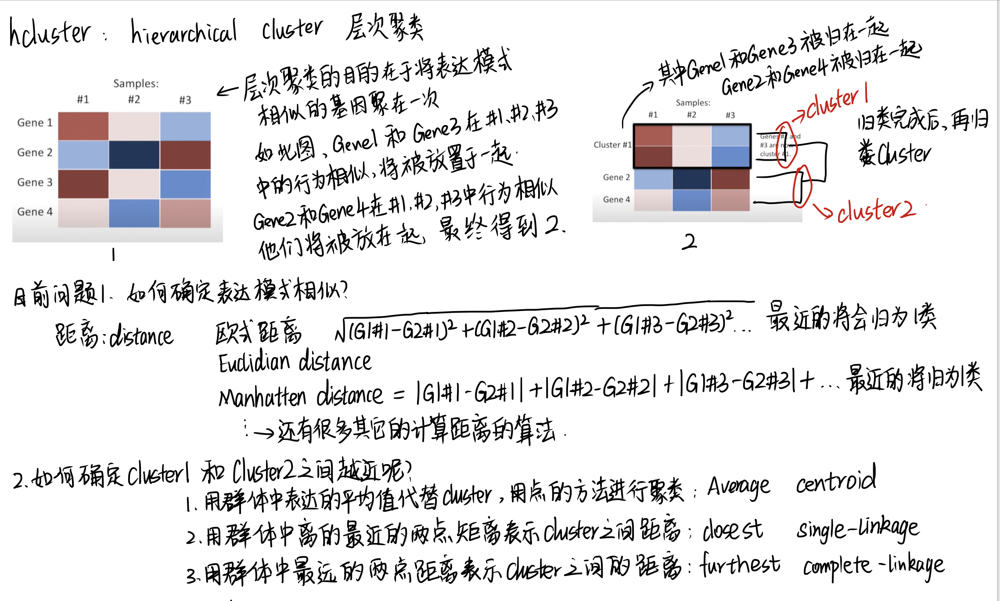

先来学习两个函数：
dist(),距离函数，用来计算矩阵行之间的距离，可以根据指定算法计算距离，默认计算距离的方式为欧几里得距离；其中有多个参数，diag：决定要不要输出对角线值；upper：要不要输出上三角，其中计算距离的method有多个，分别表示

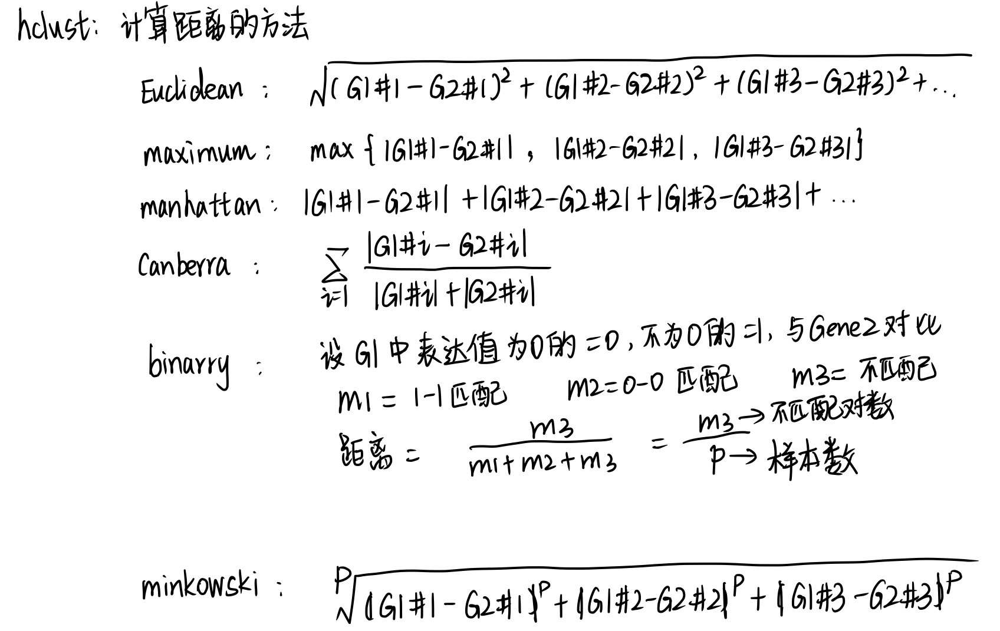

hclust()，即分层聚类函数，其输入是距离矩阵，其计算方法也有多种，目的在于计算类之间的距离,距离的计算方式有以下几种：
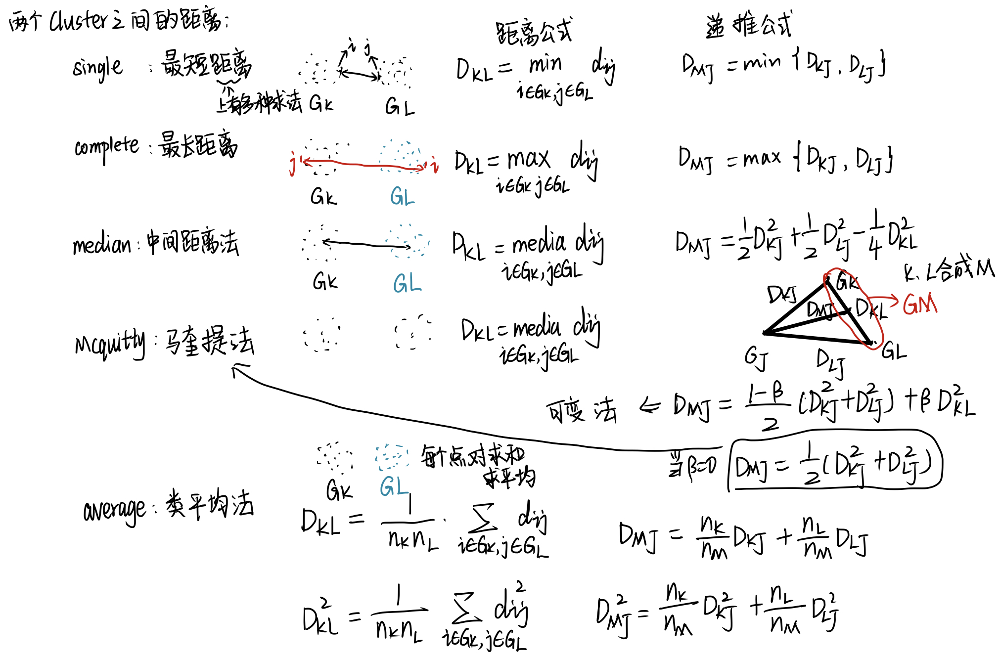

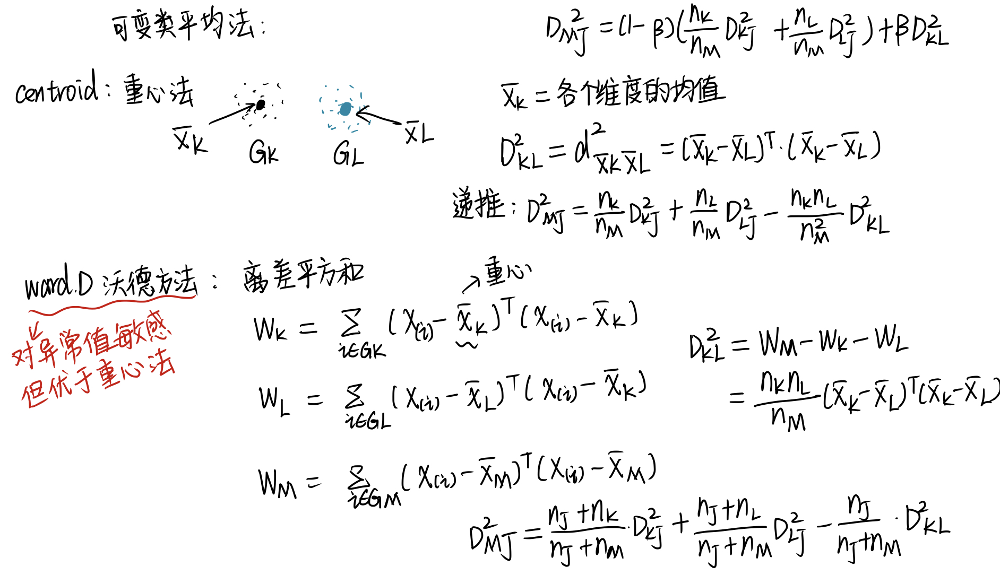

其中ward.D方法优于重心法，但是受离群值影响较大，hclust函数输出对象为一个列表，包括$merge,$height, $order, $labels, $method

In [11]:
sampleTree = hclust(dist(datExpr0), method = "average") #dist函数为生成距离矩阵的函数，这里用的默认值，即欧几里得距离；hclust指定了聚类方法为类平均法

In [12]:
#画出函数图像，首先打开一个图形输出窗口，长12，宽9英寸，我们可以更改窗口的长和宽，以使其表示合适的尺寸
sizeGrWindow(12,9)

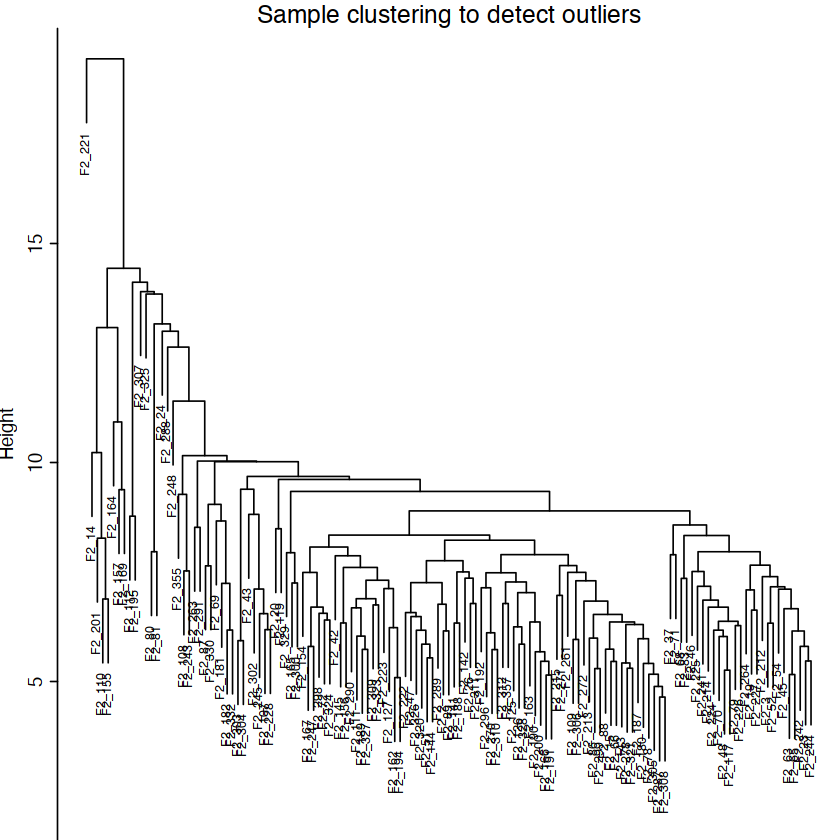

In [13]:
#剩下的图可以用pdf(file = "../result/sampleClustering.pdf", width = 12, height = 9)来保存至pdf之中，并且注意用dev.off()关闭
par(cex = 0.6) #cex 参数来控制符号大小
par(mar = c(0,4,2,0))
plot(sampleTree,
    main = "Sample clustering to detect outliers",
    sub = "",
    xlab = "",
    cex.lab = 1.5, #坐标轴标签（名称）的缩放倍数
    cex.axis = 1.5, #坐标轴刻度文字的缩放倍数
    cex.main = 2) #标题的缩放倍数

从图中可以看出，F2_221是离群值，我们可以手动去除，也可以自动去除，我们选择一个高度，高于该高度的样本将会取消，如此时我们选择高度15，用分支裁剪的方式从该高度裁剪

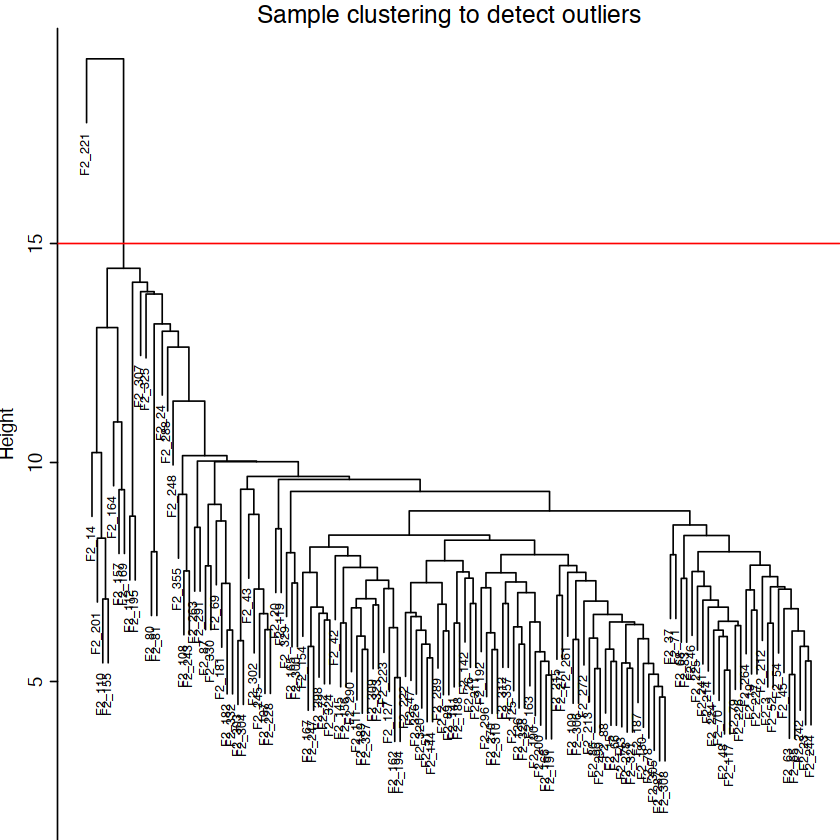

In [15]:
#剩下的图可以用pdf(file = "../result/sampleClustering.pdf", width = 12, height = 9)来保存至pdf之中，并且注意用dev.off()关闭
par(cex = 0.6) #cex 参数来控制符号大小
par(mar = c(0,4,2,0))
plot(sampleTree,
    main = "Sample clustering to detect outliers",
    sub = "",
    xlab = "",
    cex.lab = 1.5, #坐标轴标签（名称）的缩放倍数
    cex.axis = 1.5, #坐标轴刻度文字的缩放倍数
    cex.main = 2) #标题的缩放倍数
#给图中加一根红线，将cut值展示出来
abline(h = 15, col = "red")

In [16]:
clust <- cutreeStatic(sampleTree, cutHeight = 15, minSize = 10) #用之前的高度，将样本切割，该高度以下的值保留，以上的值丢弃
table(clust)

clust
  0   1 
  1 134 

In [17]:
#clust为1的值是我们想要保留的样本，clust为0的值是我们要丢弃的部分，我们可以将cluster矩阵转换为逻辑矩阵
keepSamples <- (clust == 1) #将数字矩阵转换为逻辑矩阵，keepSamples将全是T或者F
datExpr <- datExpr0[keepSamples, ]
nGenes <- ncol(datExpr) #基因个数为datExpr的行数
nSamples <- nrow(datExpr) #样本个数为datExpr的列数

现在变量datExpr就变成了我们后续要进行分析的样子，我们可以查看一下该变量的情况，这将是我们的数据要改写的模样

In [18]:
datExpr[1:6,1:6]

,MMT00000044,MMT00000046,MMT00000051,MMT00000076,MMT00000080,MMT00000102
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
F2_2,-0.0181000,-0.0773,-0.02260000,-0.00924,-0.04870000,0.17600000
F2_3,0.0642000,-0.0297,0.06170000,-0.14500,0.05820000,-0.18900000
F2_14,0.0000644,0.1120,-0.12900000,0.02870,-0.04830000,-0.06500000
F2_15,-0.0580000,-0.0589,0.08710000,-0.04390,-0.03710000,-0.00846000
F2_19,0.0483000,0.0443,-0.11500000,0.00425,0.02510000,-0.00574000
F2_20,-0.1519741,-0.0938,-0.06502607,-0.23610,0.08504274,-0.01807182


可以看到其横轴为样本，纵轴为基因

### 1.1.c 读取临床数据

我们现在可以读取临床数据，并且将样本与我们的表达样本相匹配，得到每个样本的性状数据

In [19]:
traitData <- read.csv("../data/ClinicalTraits.csv")
dim(traitData)
names(traitData)

[1] 361  38

[1] "X"                  "Mice"               "Number"            
 [4] "Mouse_ID"           "Strain"             "sex"               
 [7] "DOB"                "parents"            "Western_Diet"      
[10] "Sac_Date"           "weight_g"           "length_cm"         
[13] "ab_fat"             "other_fat"          "total_fat"         
[16] "comments"           "X100xfat_weight"    "Trigly"            
[19] "Total_Chol"         "HDL_Chol"           "UC"                
[22] "FFA"                "Glucose"            "LDL_plus_VLDL"     
[25] "MCP_1_phys"         "Insulin_ug_l"       "Glucose_Insulin"   
[28] "Leptin_pg_ml"       "Adiponectin"        "Aortic.lesions"    
[31] "Note"               "Aneurysm"           "Aortic_cal_M"      
[34] "Aortic_cal_L"       "CoronaryArtery_Cal" "Myocardial_cal"    
[37] "BMD_all_limbs"      "BMD_femurs_only"

In [20]:
# 去除掉我们不想要的基因
allTraits <- traitData[, -c(31, 16)]
allTraits <- allTraits[, c(2, 11:36)]
dim(allTraits)
names(allTraits)

[1] 361  27

[1] "Mice"               "weight_g"           "length_cm"         
 [4] "ab_fat"             "other_fat"          "total_fat"         
 [7] "X100xfat_weight"    "Trigly"             "Total_Chol"        
[10] "HDL_Chol"           "UC"                 "FFA"               
[13] "Glucose"            "LDL_plus_VLDL"      "MCP_1_phys"        
[16] "Insulin_ug_l"       "Glucose_Insulin"    "Leptin_pg_ml"      
[19] "Adiponectin"        "Aortic.lesions"     "Aneurysm"          
[22] "Aortic_cal_M"       "Aortic_cal_L"       "CoronaryArtery_Cal"
[25] "Myocardial_cal"     "BMD_all_limbs"      "BMD_femurs_only"

In [21]:
# 形成一个类似于表达数据一样的临床特征数据框
femaleSamples <- rownames(datExpr)
traitRows <- match(femaleSamples, allTraits$Mice) #match函数：匹配两个向量，并返回第二个向量在第一个向量匹配位置的下标值
datTraits <- allTraits[traitRows, -1]
rownames(datTraits) <- allTraits[traitRows, 1]

学习一个函数：match函数，非常强大，即第一个向量的元素在第二个向量的元素匹配的下标值，在这个例子之中即为，已经筛选过的表达矩阵的行名，在未经筛选的样本名下的下标值，该下标值也可以进一步的将datTrats中的元素按照datExpr的行名排好序，一一对应

In [22]:
#match函数举例
x <- c(1,"TRUE")
y <- c(T, 0, "1")
match(x,y)

[1] 3 1

其中3指的是x中的第一个元素在y中的第三个，x中的第二个元素在y中是第一个

In [48]:
collectGarbage() #执行垃圾回收，释放内存空间

现在我们有了表达矩阵，储存在datExpr中，有临床特征矩阵，储存在datTraits中，在我们开始进行网络构造和模块检测之前，我怕们可以看一下样本特征和样本聚类数的关系图

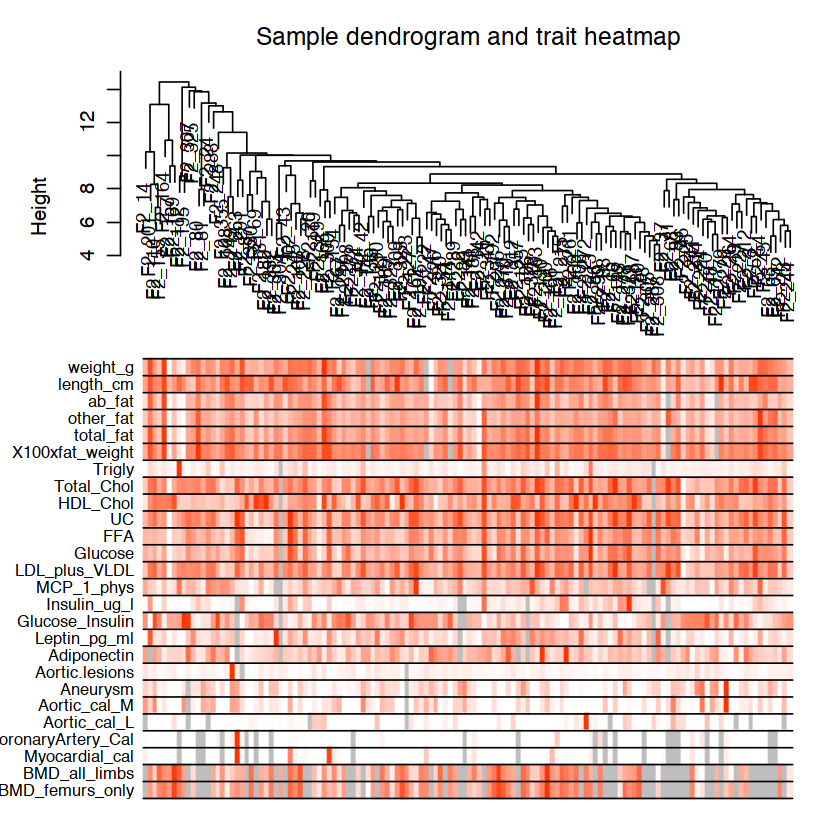

In [26]:
#重新计算聚类
sampleTree2 <- hclust(dist(datExpr), method = "average")
#将形状数据转换成颜色，白色代表低，红色代表高，灰色代表缺失值；
#这里注意，当我们的数据是非数值数据时，应用此函数会报错，此时我们应该更改自己的数据为数值数据，将分类数据改为数值数据，导出不一样的颜色
traitColors <- numbers2colors(datTraits, signed = F)
#画样本树状图，并在树状图底下画颜色图形
plotDendroAndColors(sampleTree2,
                   traitColors,
                   groupLabels = names(datTraits),
                   main = "Sample dendrogram and trait heatmap")

这一小节的最后一步，即保存表达数据和性状数据，为下一步做准备

In [27]:
save(datExpr, datTraits, file = "../data/FemaleLiver-01-dataInput.RData")#将文件保存到data文件夹下，并且以FemaleLiver-01-dataInput.RData来命名

## 1.2 网络构建和模块检测

基本设置同前，注意RData的读取，需要用到load函数，若是制定给一个变量，那这个变量将含有导入的函数变量

In [5]:
#首先打开多线程操作，目前都是多核CPU，打开多核将有利于电脑进行计算，加速计算过程
enableWGCNAThreads()
#读取第一步存储的数据，若是此时关闭掉了WGCNA，请重新加载WGCNA
lnames <- load(file = "../data/FemaleLiver-01-dataInput.RData")
#变量的名称包含在lnames之中
lnames

Allowing parallel execution with up to 11 working processes.


[1] "datExpr"   "datTraits"

可以看到，part1中我们做完处理的两个变量已经出现了，名字叫做datExpr和datTraits，方便我们后续操作。

模块的构建是WGCNA的基石，我们有三种构建模块的方式，
1. 1-step network construction: 第一种比较便捷，是一步到位法，比较适合那种想要最小的努力就能得到结果的用户；
2. Step-by-step network construction: 分步法网络构建，对于需要自主性的，可更改方法的用户来说比较适合，其可操作性更大；
3. automatic block-wise network construction：适合分析数据太大以至于不能放在一个模块中区分析

### 1.2.a 自动网络构建和模块检测（第一种构建模块的方法）
#### （1）选择阈值进行网络分析

目前我们认为基因的网络属于无标度网络（scale-free network），该网络中每个节点的连接度k与下一个点与其链接的概率p(k）呈幂律分布，意思就是，有高度连接点的基因会有更高的链接概率，而低连接点的基因链接概率也越低。其中高的链接点很少，但是非常重要，但是低的连接度的点很多，但是不重要，其网络图像大概为：
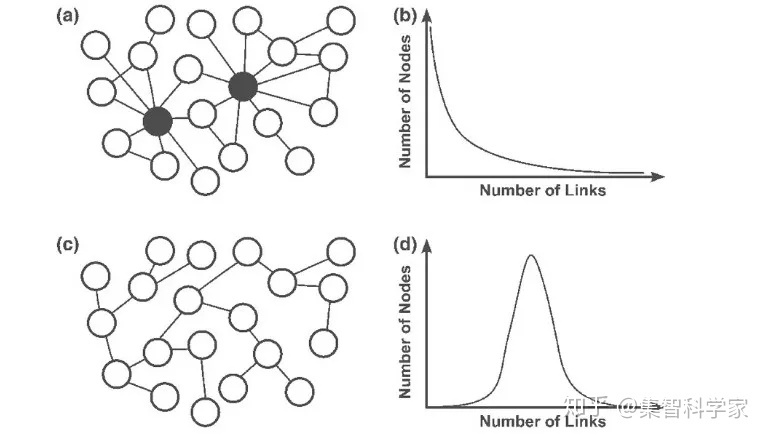

其连接度和点的个数服从幂律分布，即连接的数目越多，点越少：
$$ P(k) \sim k^{-β} \tag{1}$$

进行log转换之后，二者呈线性相关：
$$log(P(k)) = -βlog(k) \tag{2}$$

当我们的样本数据中，其adjancy matrix（邻接矩阵）或拓扑矩阵 topological overlap matrix中标度与其概率满足幂律分布时，其对应的log值应该满足线性相关，其$R^2$将逼近于1，此时的最小β值就是我们要选择的β值

说几个概念，我们的基因表达矩阵行是样本，列是基因，每个基因与其他基因做相关性（pearson相关）则得到相关性矩阵，WGCNA里成为相似性矩阵：similarity matrix，其计算公式如下 $$s_{ij} = |cor(x_i, x_j)|\tag{3}$$ $x_i$和$x_j$指代不同的基因，cor函数指代pearson相关性系数

邻接矩阵 adjency matrix（$a_{ij}$)就是相关性矩阵计算得来的，目前邻接矩阵有两种计算方式，一种是硬阈值法，其函数为signum函数，公式如下：
$$ a_{ij} = signum (s_{ij}, τ) =
\begin{cases}
0,\quad x<τ \\[2ex]
1, \quad x\geq τ
\end{cases}
\tag{4}$$

另一种为软阈值法，其函数为幂指函数，公式如下：
$$
a_{ij} = power(s_{ij}, τ) = |s_{ij}|^β
\tag{5}
$$

第三种软阈值求法为：
$$
a_{ij}=signoid(s_{ij},τ)=\frac{1}{1+e^{-\alpha(s_{ij}-\tau)}}
\tag{6}
$$

其中signoid函数和power函数的分布图如下图所示：
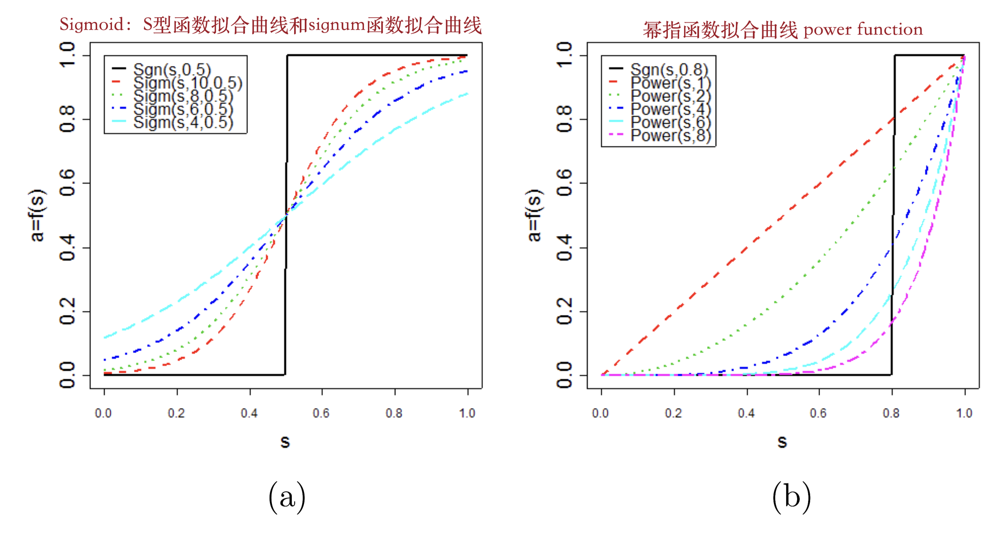

加权网络连接度(weighted network connectivity, $k_{i}$)其类似于网络中的degree，计算方式为$a_{ij}$求和，公式如下：
$$
k_{i} = \sum_{j=0}^n(a_{ij})
\tag{7}
$$

拓扑网络矩阵（topological network matrix，$w_{ij}$)的求法需要$a_{ij}$的参与，其求法为：
$$
w_{ij} = \frac{l_{ij} + a_{ij})}{min\{k_i, k_j\}+1-a_{ij}}
\tag{8}
$$
其中$l_{ij} = \sum_{u=0}^n (a_{iu}a_{ju})$,$k_i$为基因的加权网络连接度，其算法公式参考公式7

拓扑网络矩阵连接度(topological network matrix, $w_i$)即为拓扑网络中的degree，计算方式为$w_{ij}$求和，公式如下：
$$
w_i = \sum_{j=1}^n(w_{ij})
\tag{9}
$$

其中每个网络的连接度$k_i$, $w_i$应该与其出现的概率$p(k_i)$,$p(w_i)$呈幂律分布（公式1），则其对数应该满足线性相关（公式2），因为$a_{ij}$是通过β得来的，而$w_{ij}$是通过$a_{ij}$得来的，因此二者都与其β值相关，不同的β值对应不同的相关系数$R^2$，我们取使得相关系数贴近于1的最小的β值作为我们所选的β值

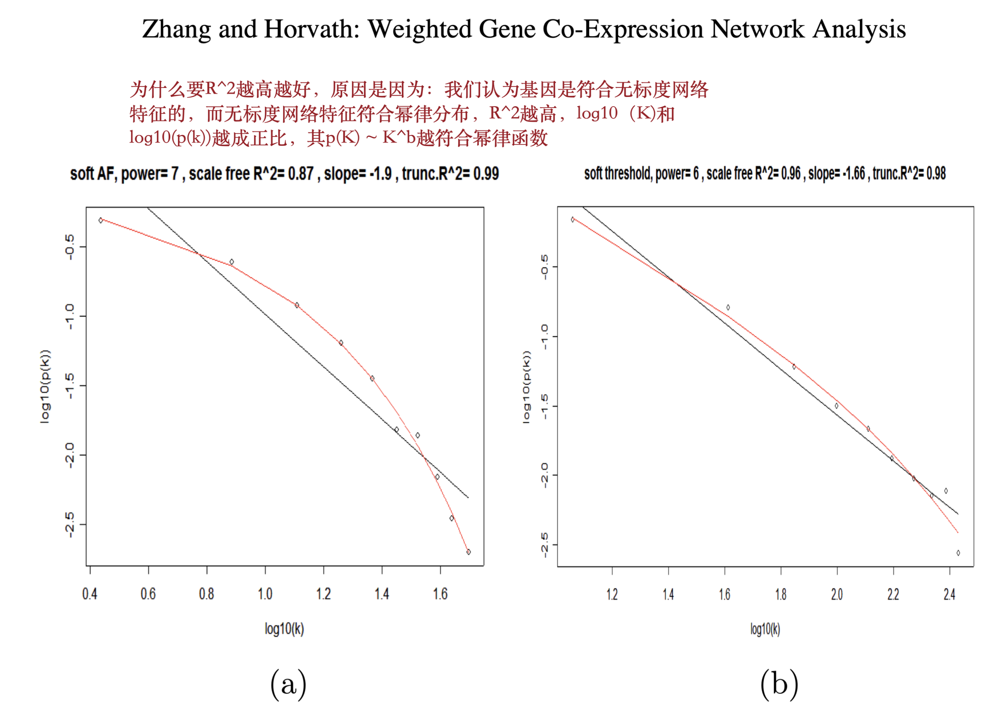

现在我们已经明白了软阈值的挑选，让我们来进一步回到WGCNA标准流程，看看WGCNA有哪些帮助挑选软阈值的函数

In [6]:
#首先自己先给一个要测量的阈值的集合，WGCNA给的教程是1:20个数，仔细看看怎么给的，前十个数没变化，后十个数每两个一个数
powers <- c(c(1:10), seq(from = 12, to = 20, by = 2))
#其中WGCNA挑选软阈值，得到相关的R^2值已经非常成熟，具体可看以下函数
sft <- pickSoftThreshold(datExpr, powerVector = powers, verbose = 5)
#sft的结果为列表，包含两个参数，一个
sft$powerEstimate #软阈值的估计值，即超过设定R^2的最小β值，该函数默认的R^2阈值为0.85，我们可以用参数 RsquaredCut 来更改至我们想要的阈值
sft$fitIndices #是一个数据框，包含不同软阈值下其R^2值的变化和其它的参数

pickSoftThreshold: will use block size 3600.
 pickSoftThreshold: calculating connectivity for given powers...
   ..working on genes 1 through 3600 of 3600
   Power SFT.R.sq  slope truncated.R.sq mean.k. median.k. max.k.
1      1   0.0278  0.345          0.456  747.00  762.0000 1210.0
2      2   0.1260 -0.597          0.843  254.00  251.0000  574.0
3      3   0.3400 -1.030          0.972  111.00  102.0000  324.0
4      4   0.5060 -1.420          0.973   56.50   47.2000  202.0
5      5   0.6810 -1.720          0.940   32.20   25.1000  134.0
6      6   0.9020 -1.500          0.962   19.90   14.5000   94.8
7      7   0.9210 -1.670          0.917   13.20    8.6800   84.1
8      8   0.9040 -1.720          0.876    9.25    5.3900   76.3
9      9   0.8590 -1.700          0.836    6.80    3.5600   70.5
10    10   0.8330 -1.660          0.831    5.19    2.3800   65.8
11    12   0.8530 -1.480          0.911    3.33    1.1500   58.1
12    14   0.8760 -1.380          0.949    2.35    0.5740   51.9


[1] 6

Power,SFT.R.sq,slope,truncated.R.sq,mean.k.,median.k.,max.k.
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.02776584,0.3445936,0.4558234,746.977852,761.73341294,1206.42886
2,0.12638769,-0.5966302,0.8432105,254.497776,250.84325945,573.54490
3,0.34037012,-1.0299440,0.9724417,111.004761,101.73566693,324.15389
4,0.50624635,-1.4215375,0.9726991,56.535969,47.24823353,202.30723
5,0.68066112,-1.7161877,0.9395555,32.154311,25.08876080,134.17527
6,0.90234867,-1.4974162,0.9621313,19.905790,14.49789064,94.77388
7,0.92124780,-1.6673879,0.9171489,13.192338,8.67834321,84.10328
8,0.90354653,-1.7240456,0.8759911,9.248524,5.39430786,76.31468
9,0.85856532,-1.7025327,0.8364939,6.795315,3.55559547,70.53172


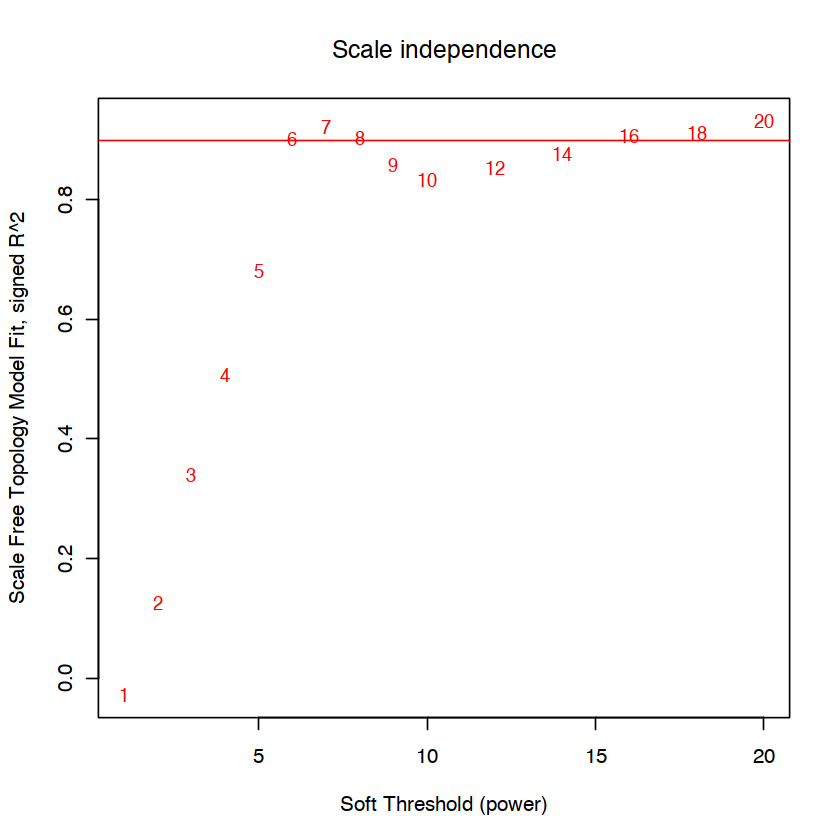

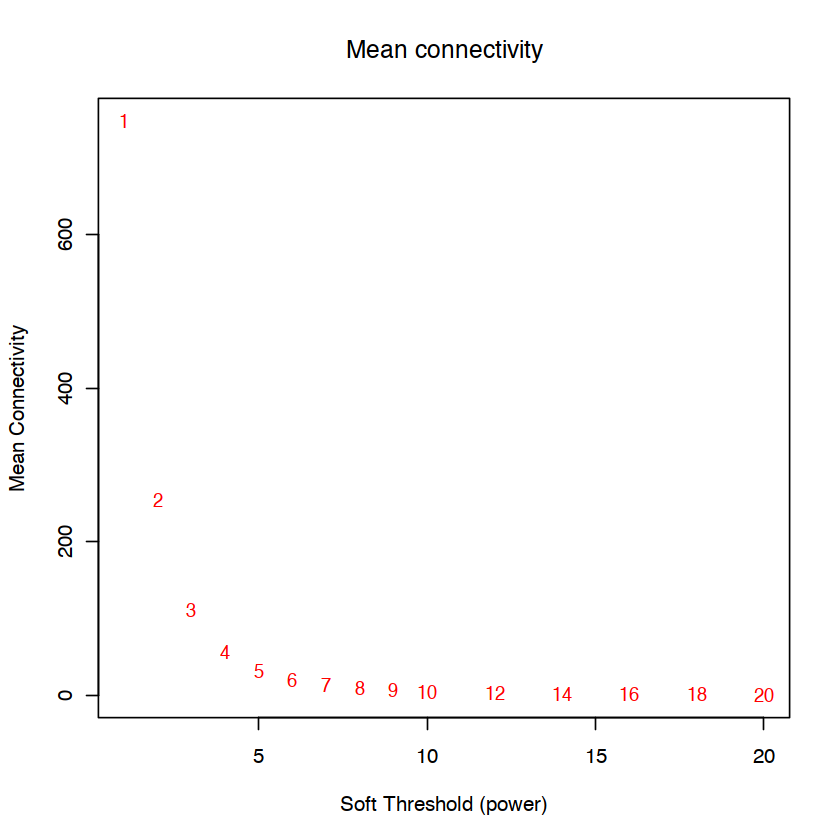

In [117]:
#以下的代码将进行数据可视化，使用的是R自带的方法绘图
#开一个窗口
#par(mfrow = c(2,2)) #要画两个图形，mfrow定义两个图形的矩阵，1行2列
#layout(matrix(c(1,2),ncol=2,byrow=T),widths = c(1,1), heights = c(1,1)) #关于layout函数的使用可以看看教程，具体就是matrix表示位置
cex1 <- 0.9;
#画不同阈值下标度与阈值之间的关系
plot(sft$fitIndices$Power, #定义x轴
    -sign(sft$fitIndices$slope)*sft$fitIndices$SFT.R.sq, #定义y轴，y轴为斜率的反方向，由公式2可知，其概率与k呈负相关关系
     # sign()函数为正负值函数，正值输出1，负值输出-1,0输出0
     xlab = "Soft Threshold (power)",
     ylab = "Scale Free Topology Model Fit, signed R^2",
     type = "n", #图形不显示，这一步是为了用数字表示点的位置
     main = paste("Scale independence")
    )
#在图像上添加文字
text(sft$fitIndices$Power, #指示了文本图像的x轴位置
    -sign(sft$fitIndices$slope)*sft$fitIndices$SFT.R.sq, #指示文本图像y轴位置
    labels = powers, #文本图像的文本
    cex = cex1, #字体大小默认值为1，此时为默认值的0.9倍
    col = "red")
#在图像上画一条红线
abline(h=0.9, col = "red")
#画出平均连接度与不同软阈值的关系图像
plot(sft$fitIndices$Power,
    sft$fitIndices$mean.k.,
    xlab = "Soft Threshold (power)", ylab = "Mean Connectivity", type = "n",
    main = paste("Mean connectivity"))
text(sft$fitIndices$Power,
    sft$fitIndices$mean.k.,
    labels = powers,
    cex = cex1,
    col = "red")

#### （2） 一步法构造网络并检测模块
WGCNA用一步法函数来构造网络，这也是其简单之处

In [62]:
net = blockwiseModules(datExpr, 
                       power = 6,
                       TOMType = "unsigned", minModuleSize = 30,
                       reassignThreshold = 0, 
                       mergeCutHeight = 0.25, #融合模块的阈值，层次聚类高于该阈值的将被归为一个模块
                       numericLabels = T, 
                       pamRespectsDendro = F,
                       saveTOMs = T,
                       saveTOMFileBase = "../data/femaleMouseTOM",
                       verbose = 3)

 Calculating module eigengenes block-wise from all genes
   Flagging genes and samples with too many missing values...
    ..step 1
Cluster size 3600 broken into 2108 1492 
Cluster size 2108 broken into 1126 982 
Done cluster 1126 
Done cluster 982 
Done cluster 2108 
Done cluster 1492 
 ..Working on block 1 .
    TOM calculation: adjacency..
    ..will use 11 parallel threads.
     Fraction of slow calculations: 0.383966
    ..connectivity..
    ..matrix multiplication (system BLAS)..
    ..normalization..
    ..done.
   ..saving TOM for block 1 into file ../data/femaleMouseTOM-block.1.RData
 ....clustering..
 ....detecting modules..
 ....calculating module eigengenes..
 ....checking kME in modules..
     ..removing 1 genes from module 1 because their KME is too low.
     ..removing 1 genes from module 7 because their KME is too low.
     ..removing 1 genes from module 8 because their KME is too low.
     ..removing 1 genes from module 21 because their KME is too low.
 ..merging modul

In [64]:
net$colors #包含赋予模块的颜色
net$MEs #包含每个模块的ME值

MMT00000044 MMT00000046 MMT00000051 MMT00000076 MMT00000080 MMT00000102 
          0           1           1          17           4          12 
MMT00000149 MMT00000159 MMT00000207 MMT00000212 MMT00000231 MMT00000241 
          5           6           7           1           1           4 
MMT00000268 MMT00000283 MMT00000334 MMT00000365 MMT00000368 MMT00000373 
          4           5           1           4           4           2 
MMT00000384 MMT00000401 MMT00000418 MMT00000464 MMT00000517 MMT00000525 
          2           2          15           1          14          15 
MMT00000549 MMT00000550 MMT00000602 MMT00000608 MMT00000701 MMT00000713 
          4           5          14           2           5           9 
MMT00000719 MMT00000743 MMT00000792 MMT00000793 MMT00000801 MMT00000840 
          4          13           4           6           0           6 
MMT00000864 MMT00000887 MMT00000963 MMT00000988 MMT00000996 MMT00001022 
         18           3           2           2           1          10 
MMT00001077 MMT00001085 MMT00001100 MMT00001110 MMT00001154 MMT00001185 
          3           2          14           4           6           3 
MMT00001190 MMT00001245 MMT00001260 MMT00001291 MMT00001298 MMT00001318 
          5           6           6           4           0           1 
MMT00001373 MMT00001387 MMT00001394 MMT00001397 MMT00001423 MMT00001434 
          1           2          15           1           4           1 
MMT00001486 MMT00001496 MMT00001510 MMT00001545 MMT00001555 MMT00001587 
          3           1           1           4           5           8 
MMT00001596 MMT00001613 MMT00001646 MMT00001675 MMT00001698 MMT00001714 
         11           1          15           1           6           2 
MMT00001732 MMT00001791 MMT00001806 MMT00001923 MMT00001947 MMT00001949 
          4           4           2           9           1          11 
MMT00001995 MMT00002002 MMT00002004 MMT00002021 MMT00002022 MMT00002037 
          2           3           4           0           5           3 
MMT00002042 MMT00002046 MMT00002048 MMT00002050 MMT00002099 MMT00002102 
          7          12           4           6          12           3 
MMT00002151 MMT00002160 MMT00002161 MMT00002175 MMT00002209 MMT00002227 
         15           1          17          11           3           7 
MMT00002238 MMT00002272 MMT00002304 MMT00002330 MMT00002338 MMT00002391 
         12           1           5           1           2           0 
MMT00002392 MMT00002494 MMT00002521 MMT00002529 MMT00002532 MMT00002546 
          2           8           4           0           7           1 
MMT00002575 MMT00002592 MMT00002594 MMT00002597 MMT00002655 MMT00002755 
          3           1           1           5           7           7 
MMT00002758 MMT00002824 MMT00002875 MMT00002932 MMT00002956 MMT00003016 
          3           3           1           1           2           1 
MMT00003058 MMT00003069 MMT00003071 MMT00003081 MMT00003107 MMT00003127 
          2           1           2           3          10           9 
MMT00003136 MMT00003188 MMT00003211 MMT00003214 MMT00003278 MMT00003342 
         17           6           2           8           7           2 
MMT00003365 MMT00003391 MMT00003410 MMT00003424 MMT00003453 MMT00003456 
          2           1           6           1           1           2 
MMT00003470 MMT00003498 MMT00003506 MMT00003530 MMT00003533 MMT00003545 
         14           8           4           5           1           9 
MMT00003569 MMT00003575 MMT00003586 MMT00003596 MMT00003620 MMT00003651 
          1          13           3           3           1           1 
MMT00003672 MMT00003724 MMT00003764 MMT00003905 MMT00003906 MMT00003908 
          4          11           4           1           9           1 
MMT00003950 MMT00003968 MMT00003970 MMT00003975 MMT00003980 MMT00003982 
          5           9           3           8           5           3 
MMT00003994 MMT00004034 MMT00004086 MMT00004126 MMT0000414

,ME9,ME7,ME1,ME5,ME16,ME2,ME3,ME6,ME4,ME13,ME18,ME11,ME17,ME8,ME10,ME12,ME14,ME15,ME0
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
F2_2,-0.0220043399,0.0138038628,0.020235746,0.00700289,-0.016148316,-0.133788469,-0.0672345791,-0.103267494,0.0410177922,-0.0817921553,6.276361e-03,0.010275223,0.0068000207,-0.085623458,4.138109e-02,0.1297845897,-0.041330045,0.024666957,-0.005516121
F2_3,-0.0040997709,0.0668404876,0.037534888,0.07245049,0.097142579,-0.043061702,-0.0282839947,0.127507636,-0.0009540238,0.0965769161,1.032653e-02,-0.013670972,-0.0160466911,-0.003825216,-2.369461e-02,-0.0777783536,-0.032333807,0.011114237,0.012643041
F2_14,0.5937931427,0.0667271646,0.192667505,0.06273511,0.120674767,0.022259117,0.0053828781,-0.109244628,-0.0841292811,-0.1148383426,3.707524e-03,0.028568172,-0.0408614194,-0.116514805,-2.048013e-01,-0.1907215150,-0.088634846,-0.077699042,-0.015671137
F2_15,-0.0320261589,-0.0643323004,-0.022111527,0.05026212,0.038937851,-0.026524620,0.0486231830,0.128490893,0.0909333146,0.0629044547,-1.906714e-02,-0.022640042,-0.0135191021,-0.028567959,-3.421073e-02,0.0407762130,-0.005621771,0.045704562,-0.021892000
F2_19,0.0008837849,0.0637495925,0.062368844,0.01686188,0.021636828,0.087904933,0.0454251695,-0.010859886,-0.0709378322,-0.1975825013,1.779664e-02,0.003104716,-0.0233441612,-0.030700040,-4.141718e-02,-0.0403690083,-0.021607772,-0.018386337,0.000452492
F2_20,0.0325334600,-0.0008963038,0.008622309,0.04962564,-0.020397882,0.028216194,0.0093470273,0.015779018,0.0653004166,0.0371301167,-4.025227e-02,0.033463526,0.1113294049,-0.091325191,-2.197066e-02,0.1039128889,0.080661447,0.114072095,-0.034694476
F2_23,-0.0139702357,0.0926023992,0.138563545,0.07390400,0.103195107,0.025054480,0.0055696754,0.059216240,0.0264446814,0.0407804727,1.781434e-02,-0.017698782,-0.0439855882,-0.090341749,-6.911716e-02,-0.1156099733,-0.101106910,-0.035147845,-0.028202546
F2_24,-0.0043621184,0.0559722235,0.103035066,0.07813619,0.082984923,-0.081032758,-0.0163756946,-0.077420970,-0.0116723712,0.1301484668,3.152789e-02,-0.002179652,0.0355376159,-0.072616885,-1.134994e-01,-0.0845585508,-0.057856842,-0.005742324,-0.740501480
F2_26,-0.0092315217,-0.0660004826,-0.129931590,-0.14142078,-0.190923107,-0.087479218,-0.0302783710,-0.061872517,0.1661325802,0.1036812721,4.554457e-03,-0.005937065,0.0315232537,0.020508118,1.785280e-01,0.1821243046,-0.012843297,-0.023046868,-0.008605567


模块的ME的求法根据PCA主成分分析方法，其中ME值就是PC1，即第一主成分，能最大限度的展示这个模块的变化，相当于对模块进行一维降维
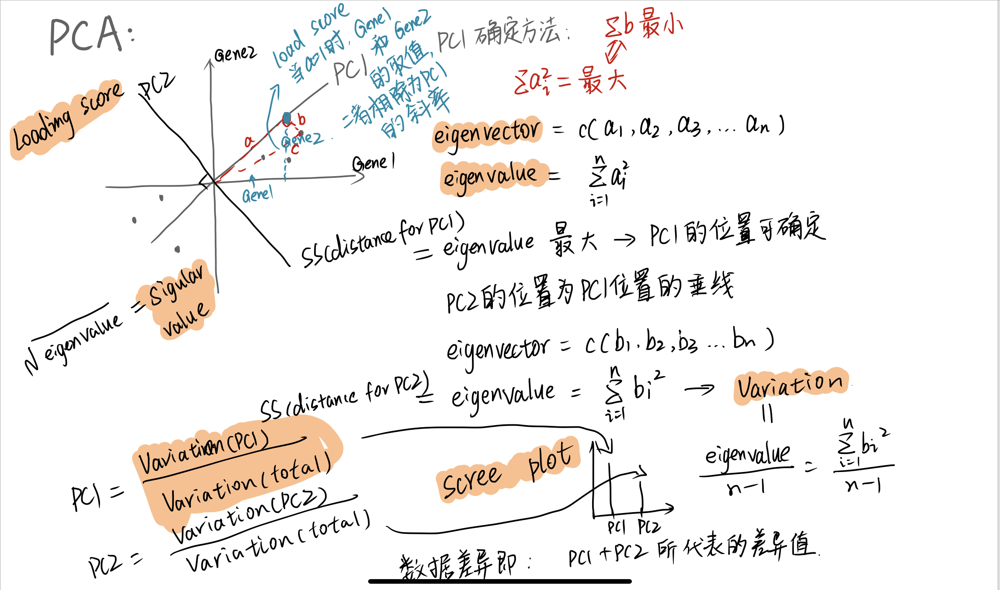

**注意：** blockwiseModules函数包含有多个默认数据，这里建议大家看一下blockwiseModules的参数，根据自己的网络调整合适的参数进行分析
**注意：** 参数maxBlockSize的调整根据使用者电脑所能承载的最大量设置的，默认值为5000，当模块超过5000个基因时，blockwiseModules函数将会分裂该模块。
- 不同电脑配置有着不同的maxBlockSize值，一般16GB-20000；32G-30000
- 当数据过大，读者可遵从2.c部分进行编码.  

现在我们得到了net值，我们可以看一下我们有多少模块，以及各个模块的大小（所含基因的多少）

In [65]:
table(net$colors)


  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18 
 99 609 460 409 316 312 221 211 157 123 106 100  94  91  77  76  58  47  34 

我们获得了18个模块，0代表该模块含有未被纳入的基因，最大609个基因，最少34个基因

因为用的是分层聚类，因此模块中会存在模块聚类树，名字叫做net$dendrograms[[1]]，可以将树状图和模块一起展示出来，其中模块可以用不同的颜色替代

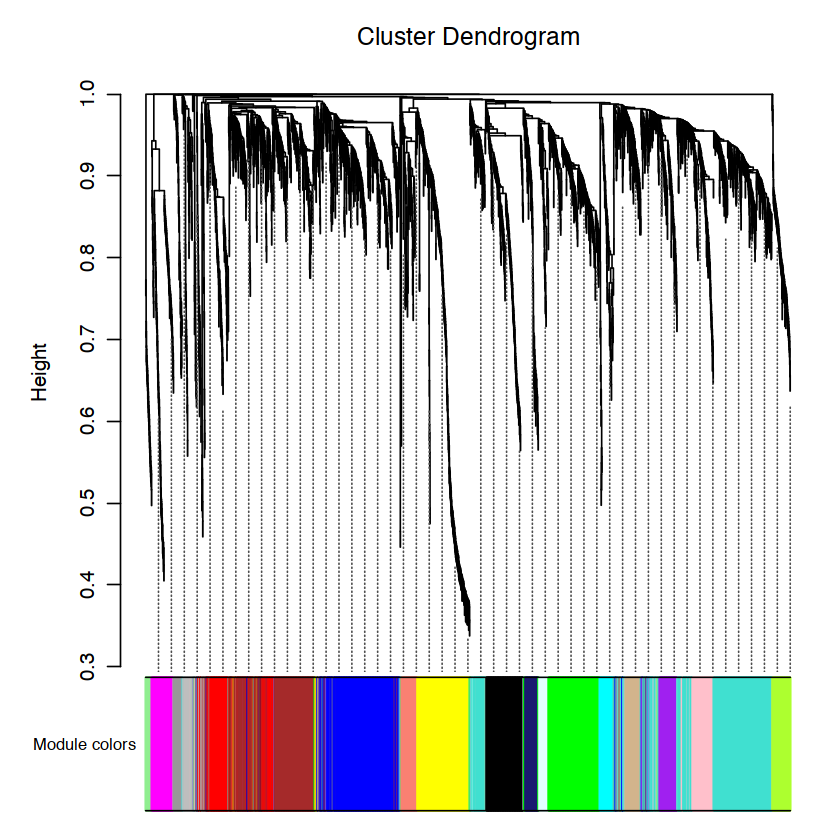

In [68]:
#将模块随机赋予颜色
mergedColors <- labels2colors(net$colors) #其中colorSeq参数能够自主给每个模块赋不同的颜色，更适合配色而不是用WGCNA自带颜色
#画图，上面画树状图，下面画模块图
plotDendroAndColors(net$dendrograms[[1]], mergedColors[net$blockGenes[[1]]],
                   "Module colors",
                   dendroLabels = F, hang = 0.03,
                   addGuide = T, guideHang = 0.05)

图像结果展示在图中，如果我们想要改变剪切的高度以显示不同的模块，WGCNA提供 recutBlockwiseTrees函数，能够在不运行一遍网络构建的情况下，调整树状图的截断值来调整模块的成员和融合标准，这将节省大量时间。

In [69]:
#现在保存模块分配和模块特征基因信息，以用来后续分析
moduleLabels = net$colors
moduleColors = labels2colors(net$colors)
MEs <- net$MEs
geneTree <- net$dendrograms[[1]]
save(MEs, moduleLabels, moduleColors, geneTree,
    file = "../data/FemaleLiver-02-networkContruction-auto.RData")

### 1.2.b Step-by-step network construction and module detection
#### （1） 选择软阈值
其方式同前所述，因此不过多赘述
#### （2）共表达相似性和邻接矩阵 co-expression similarity and adjacency
现在我们计算邻接矩阵，使用软阈值为6

In [70]:
softPower = 6
adjacency <- adjacency(datExpr, power = softPower)

#### （3）计算拓扑重叠矩阵 topological overlap matrix (TOM)
为了减少噪声和额外的链接，我们将邻接矩阵变为拓扑矩阵，以此计算其不相似性，即距离矩阵，方便聚类

In [71]:
#将邻接矩阵变为拓扑重叠矩阵
TOM <- TOMsimilarity(adjacency)
dissTOM <- 1 - TOM

..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.


#### （4）使用TOM距离矩阵进行层次聚类
我们使用层次聚类算法，产生层次聚类树。我们使用hclust函数比基本的hclust函数更快

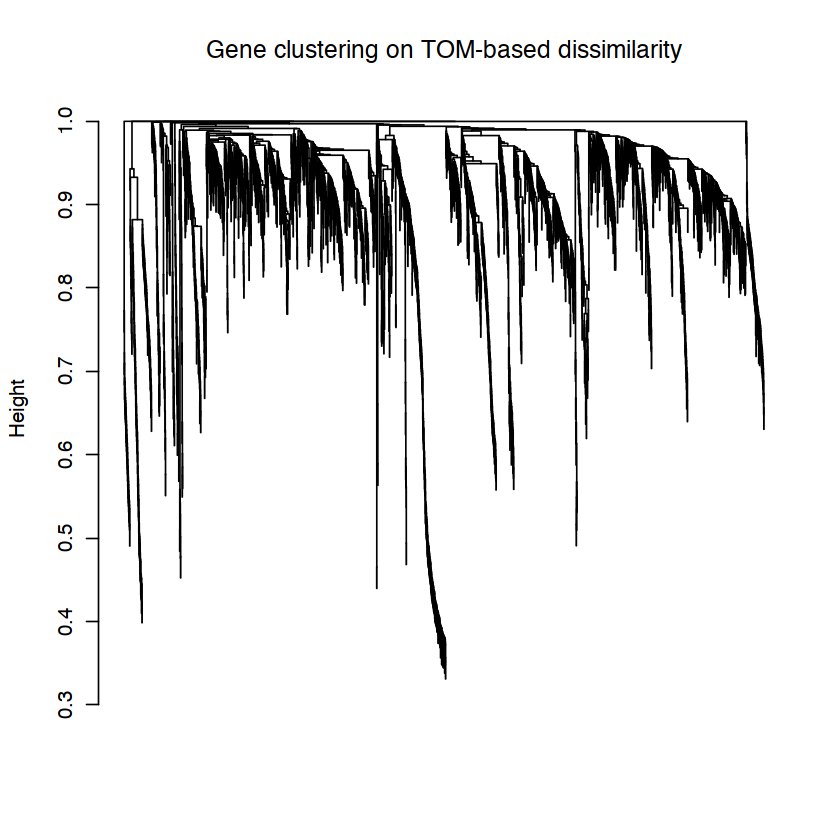

In [73]:
#使用层次聚类函数
geneTree = hclust(as.dist(dissTOM), method = "average")
#画出结构聚类树（树状图）
plot(geneTree, xlab = "", sub = "", main = "Gene clustering on TOM-based dissimilarity",
    labels = F, hang = 0.04)

模块即为聚类树的一个个分支，我们使用dynamicTreeCut进行聚类树动态切割

In [74]:
#我们喜欢大模块，因此我们设置最小模块含有的基因数也相对较高
minModuleSize = 30
#模块的鉴定使用动态树剪切方式（dynamic tree cut）
dynamicMods <- cutreeDynamic(dendro = geneTree, distM = dissTOM,
                            deepSplit = 2, pamRespectsDendro =F,
                            minClusterSize = minModuleSize)
table(dynamicMods)

 ..cutHeight not given, setting it to 0.996  ===>  99% of the (truncated) height range in dendro.
 ..done.


dynamicMods
  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18  19 
 88 614 316 311 257 235 225 212 158 153 121 106 102 100  94  91  78  76  65  58 
 20  21  22 
 58  48  34 

dynamicColors
       black         blue        brown         cyan    darkgreen      darkred 
         212          316          311           94           34           48 
       green  greenyellow         grey       grey60    lightcyan   lightgreen 
         235          106           88           76           78           65 
 lightyellow      magenta midnightblue         pink       purple          red 
          58          153           91          158          121          225 
   royalblue       salmon          tan    turquoise       yellow 
          58          100          102          614          257 

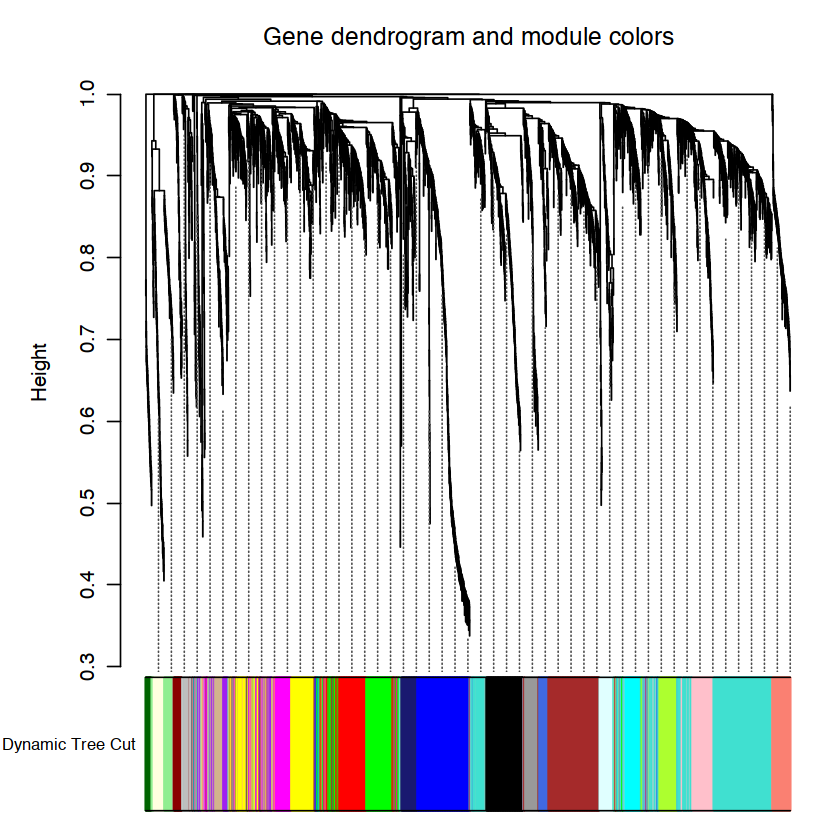

In [75]:
#将模块随机赋予颜色
dynamicColors <- labels2colors(dynamicMods) #其中colorSeq参数能够自主给每个模块赋不同的颜色，更适合配色而不是用WGCNA自带颜色
table(dynamicColors)
#画图，上面画树状图，下面画模块图
plotDendroAndColors(geneTree, dynamicColors,
                   "Dynamic Tree Cut",
                   dendroLabels = F, hang = 0.03,
                   addGuide = T, guideHang = 0.05,
                   main = "Gene dendrogram and module colors")

#### （5）将表达相似的模块融合起来
dynamic tree cut鉴定的模块有的表达模式非常相似，因此我们可以将共表达模块融合起来，为了计算整个模块的共表达相似性，我们计算他们的特征基因，并且按他们之间的相关性进行聚类

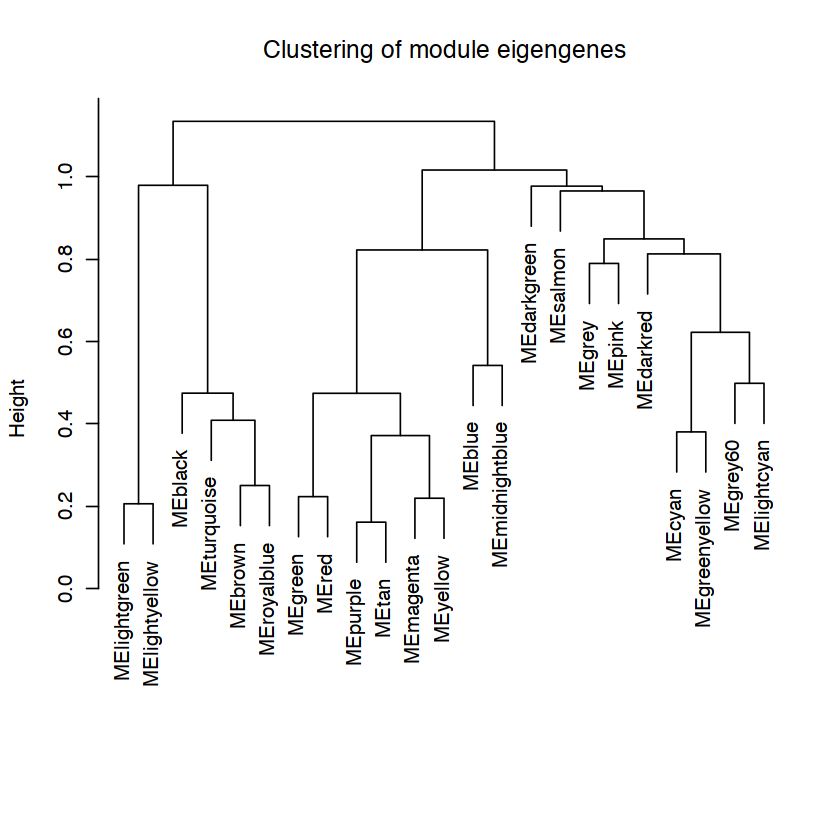

In [76]:
#计算特征基因
MEList <- moduleEigengenes(datExpr, colors = dynamicColors)
MEs <- MEList$eigengenes
#计算特征基因的距离（dissimilarity，不相似度）
MEDiss <- 1 - cor(MEs)
#聚类模块特征基因
METree <- hclust(as.dist(MEDiss), method = "average")
#将结果可视化
plot(METree, main = "Clustering of module eigengenes",
    xlab = "", sub = "")

 mergeCloseModules: Merging modules whose distance is less than 0.25
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 23 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 19 module eigengenes in given set.
   Calculating new MEs...
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 19 module eigengenes in given set.


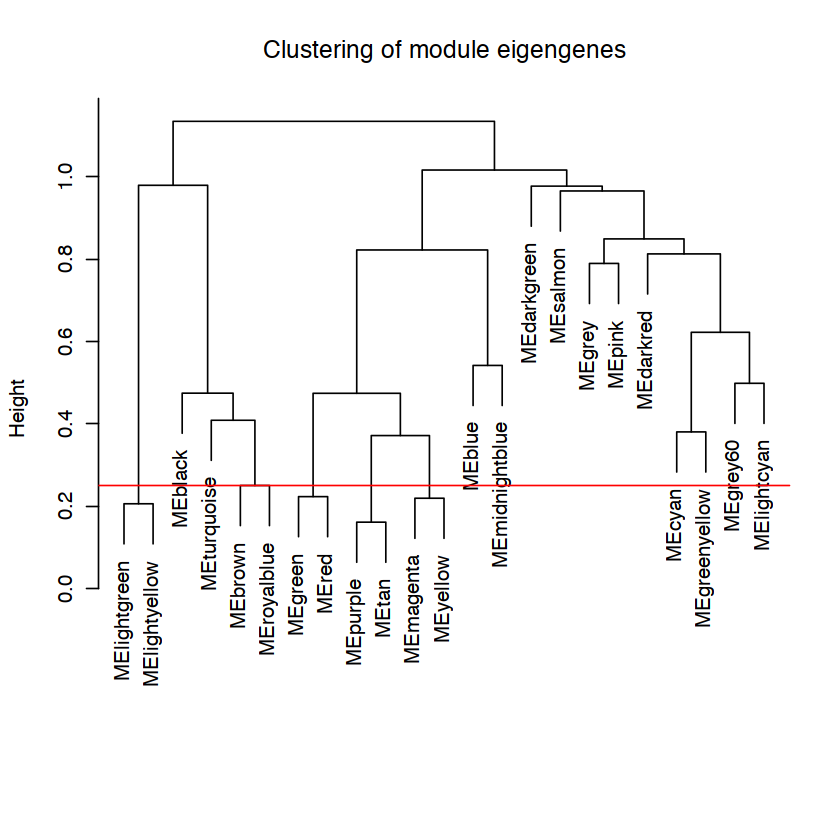

In [77]:
#我们选择cut height为0.25，这对应的是其相关性为0.75，相关性高于此值的将被融合
MEDissThres <- 0.25
plot(METree, main = "Clustering of module eigengenes",
    xlab = "", sub = "")
#画一条阈值线
abline(h=MEDissThres, col = "red")
#自动融合矩阵
merge <- mergeCloseModules(datExpr, dynamicColors, cutHeight = MEDissThres, verbose = 3)
#融合模块的颜色
mergedColors <- merge$colors
#新融合的模块特征基因
mergedMEs <- merge$newMEs

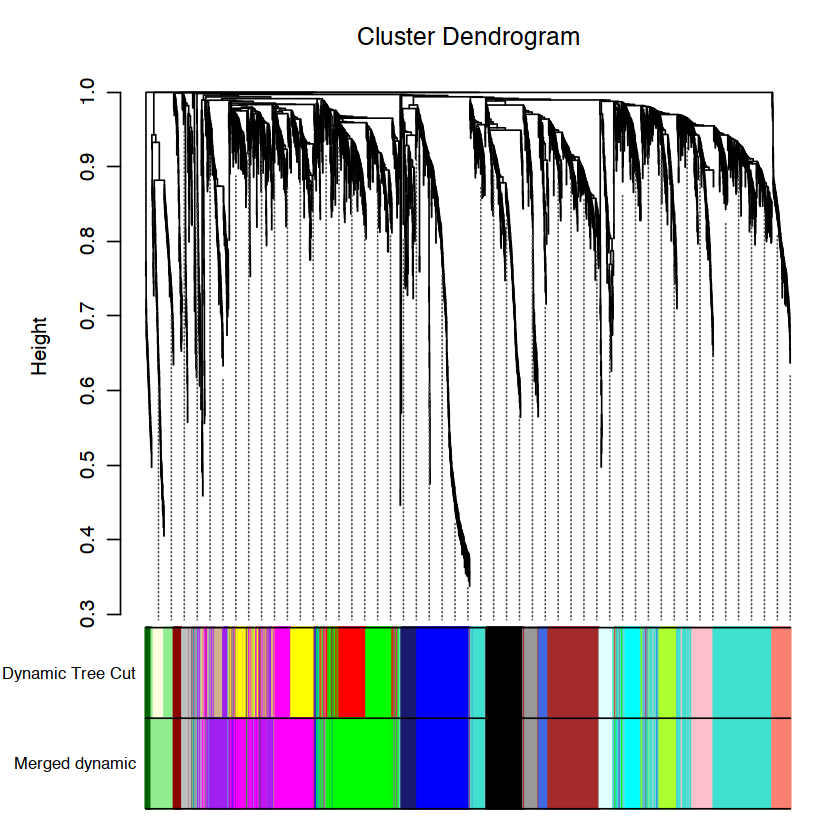

In [78]:
#为了看一看模块融合函数对我们的模块都做了什么，我们再次绘制树状图
plotDendroAndColors(geneTree, cbind(dynamicColors, mergedColors),
                   c("Dynamic Tree Cut", "Merged dynamic"),
                   dendroLabels = FALSE, hang = 0.03,
                   addGuide = TRUE, guideHang = 0.05)

在后续的分析中，我们将使用融合的模块颜色进行分析，我们保存相关的变量，以备后续使用

In [82]:
#重命名模块颜色
moduleColors <- mergedColors
#建立数字字符，与颜色一一对应起来
colorOrder <- c("grey", standardColors(50))
moduleLabels <- match(moduleColors, colorOrder) - 1
MEs <- mergedMEs
#保存相关的文件
save(MEs, moduleLabels, moduleColors, geneTree,
    file = "../data/FemaleLiver-02-networkConstruction-stepByStep.RData")

## 1.3 与外部信息相关的模块用以鉴定重要基因
### 1.3.a 量化 模块-性状的关联性
模块与性状的相关性被定义为特征基因与性状之间的相关性，当性状符合正态分布时，可以使用pearson相关性量化计算（公式10）也可以用p-value（公式11）计算
$$
GS_i = cor({ME}_i,T)
\tag{10}
$$


$$
GS_i = -log(p_i)
\tag{11}
$$

In [83]:
#定义基因和样本数量
nGenes <- ncol(datExpr)
nSamples <- nrow(datExpr)
#重新计算不同颜色的MEs值
MEs0 <- moduleEigengenes(datExpr, moduleColors)$eigengenes
MEs <- orderMEs(MEs0) #将MEs0排序,使相似的向量彼此相邻
moduleTraitCor <- cor(MEs, datTraits, use = "p") #使用pearson相关系数进行相关性分析
moduleTraitPvalue <- corPvalueStudent(moduleTraitCor, nSamples) #使用Student t test计算p值

Warning message in greenWhiteRed(50):
“WGCNA::greenWhiteRed: this palette is not suitable for people
with green-red color blindness (the most common kind of color blindness).
Consider using the function blueWhiteRed instead.”


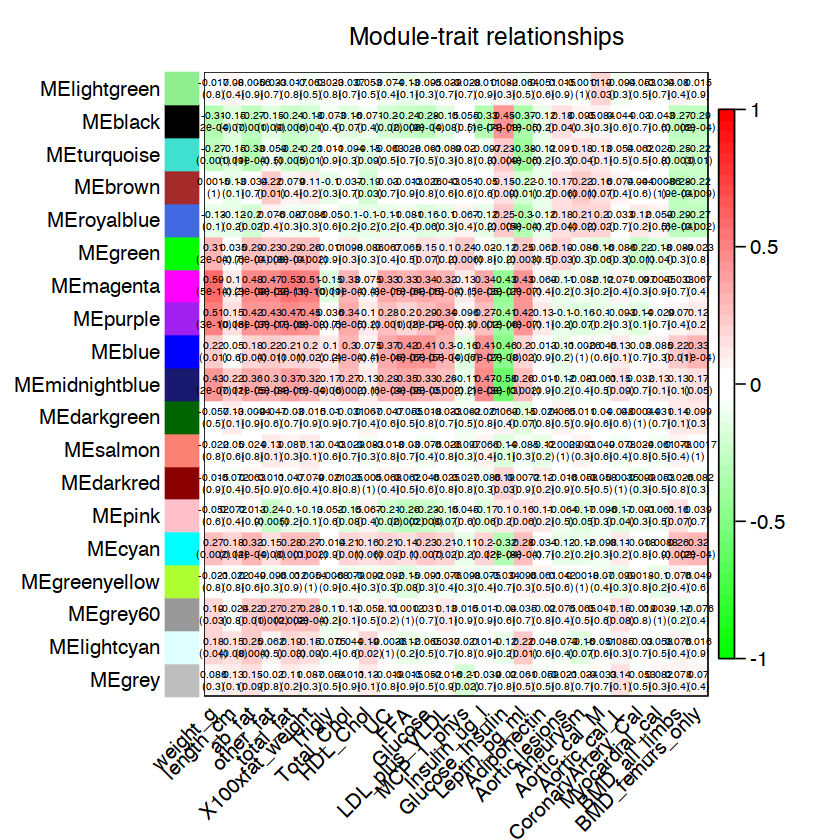

In [95]:
#用热图的方式进行展示
#编辑热图上面要显示的文字矩阵
textMatrix <- paste(signif(moduleTraitCor, 2), "\n(", #添加的\n表示回车的意思，即P值将显示在下一行
                   signif(moduleTraitPvalue, 1), ")", sep = "") #signif的意思是保留两位小数。
dim(textMatrix) <- dim(moduleTraitCor)
par(mar = c(6,8.5,3,3))
#用热图展示相关性值
labeledHeatmap(Matrix = moduleTraitCor,
              xLabels = names(datTraits),
              yLabels = names(MEs),
              ySymbols = names(MEs),
              colorLabels = F,
              colors = greenWhiteRed(50),
              textMatrix = textMatrix,
              setStdMargins = F,
              cex.text = 0.5,
              zlim = c(-1,1),
              main = paste("Module-trait relationships"))

### 1.3.b 基因性状相关性和重要模块：基因相关性和模块成员Member Membership
Gene significance （GS）：量化单个基因与我们感兴趣的性状（权重）的关联，其公式为：
$$
GS_i = |cor(x_i,T)|
\tag{12}
$$
MM:module membership，其定义为模块内的基因表达与模块特征基因之间的相关性，其公式为：
$$
MM_i = |cor(x_i, ME_i)|
\tag{13}
$$

In [97]:
#我们选择体重向量作为感兴趣的性状
weight <- as.data.frame(datTraits$weight_g)
names(weight) <- "weight"
#将模块的颜色名导出
modNames <- substring(names(MEs),3)
##计算MM
geneModuleMembership <- as.data.frame(cor(datExpr, MEs, use = "p"))
MMPvalue <- as.data.frame(corPvalueStudent(as.matrix(geneModuleMembership), nSamples))
names(geneModuleMembership) <- paste("MM", modNames, sep="")
names(MMPvalue) <- paste("p.MM", modNames, sep="")
##计算GS
geneTraitSignificance <- as.data.frame(cor(datExpr, weight, use = "p"))
GSPvalue <- as.data.frame(corPvalueStudent(as.matrix(geneTraitSignificance), nSamples))
names(geneTraitSignificance) <- paste("GS.", names(weight), sep="")
names(GSPvalue) <- paste("p.GS.", names(weight), sep="")

#看一下MM和GS矩阵的样子
head(geneModuleMembership)
head(geneTraitSignificance)

,MMlightgreen,MMblack,MMturquoise,MMbrown,MMroyalblue,MMgreen,MMmagenta,MMpurple,MMblue,MMmidnightblue,MMdarkgreen,MMsalmon,MMdarkred,MMpink,MMcyan,MMgreenyellow,MMgrey60,MMlightcyan,MMgrey
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
MMT00000044,0.02485814,0.06893329,-0.16004270,-0.11340566,-0.11408510,0.03857331,-0.14261351,-0.03696718,-0.20686440,-0.2405617,0.142285141,0.015823037,-0.02353380,0.26251448,-0.02736107,0.17772784,-0.04710795,0.02633961,0.5591184
MMT00000046,0.05952419,0.17672545,0.78852635,0.32362024,0.46135851,0.18331339,0.09739093,0.03167548,0.01134570,-0.1567114,0.005556188,0.003853832,-0.17627738,-0.54175750,-0.62131195,-0.67714558,-0.32973191,-0.60336372,-0.1850150
MMT00000051,-0.07295982,-0.32001047,-0.74694994,-0.26901509,-0.41531600,0.13993680,0.28049996,0.50309752,-0.01198054,0.3854633,-0.151770474,0.087522571,0.10677360,0.51008182,0.41495731,0.68587003,0.24659870,0.41860662,0.1820393
MMT00000076,-0.02133469,0.01370505,-0.09603448,-0.04991810,-0.05497927,0.13118313,0.16038308,0.10567346,0.02248132,0.1637384,0.048824638,-0.022856126,-0.66889060,0.04125314,0.09399444,0.01699221,0.04651633,0.08295291,0.2679798
MMT00000080,0.06343264,0.64622469,-0.01187089,0.07542028,0.32164450,-0.02644253,-0.24409365,-0.21676369,-0.74754866,-0.2700942,0.117623936,-0.159030139,0.08698103,0.46967692,-0.44084339,-0.08347543,-0.02528745,0.10825026,0.1002940
MMT00000102,-0.08275015,-0.05386763,-0.35896905,-0.19256077,-0.31720361,-0.41991963,-0.44786319,-0.50630838,0.10728723,-0.2139246,0.138298380,0.097344913,0.10856644,0.14069859,0.57697754,0.52387659,0.22737189,0.34880665,0.1244488


,GS.weight
,<dbl>
MMT00000044,-0.06937286
MMT00000046,-0.07525085
MMT00000051,0.24342785
MMT00000076,0.17121953
MMT00000080,-0.21325726
MMT00000102,-0.23079523


### 1.3.c 模块内分析：找有高GS和高MM的基因
我们在模块-性状图中发现品红模块与体重密切相关，因此我们选择棕色模块进行分析

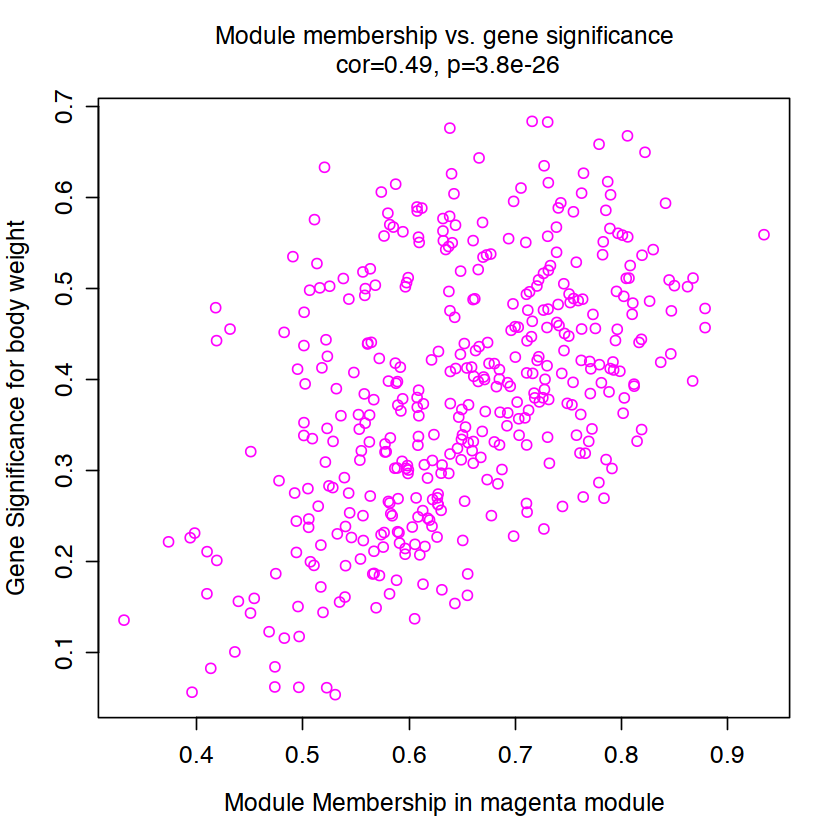

In [99]:
module <- "magenta"
column <- match(module, modNames) #取符合模块的列
#取在模块之中的基因
moduleGenes <- moduleColors == module #返回逻辑向量值，将匹配module的moduleColors全都标为T，其余的标F
#画出散点图，以显示其相关性
verboseScatterplot(abs(geneModuleMembership[moduleGenes, column]), #MM值的绝对值
                  abs(geneTraitSignificance[moduleGenes, 1]),
                  xlab = paste("Module Membership in", module, "module"),
                  ylab = paste("Gene Significance for body weight"),
                  main = paste("Module membership vs. gene significance\n"),
                  cex.main=1.2, cex.lab=1.2, cex.axis=1.2,col=module)

### 1.3.d 总结网络结果
总结网络结果，并将结果导出为excel可查看的文件

In [100]:
names(datExpr)

[1] "MMT00000044" "MMT00000046" "MMT00000051" "MMT00000076" "MMT00000080"
   [6] "MMT00000102" "MMT00000149" "MMT00000159" "MMT00000207" "MMT00000212"
  [11] "MMT00000231" "MMT00000241" "MMT00000268" "MMT00000283" "MMT00000334"
  [16] "MMT00000365" "MMT00000368" "MMT00000373" "MMT00000384" "MMT00000401"
  [21] "MMT00000418" "MMT00000464" "MMT00000517" "MMT00000525" "MMT00000549"
  [26] "MMT00000550" "MMT00000602" "MMT00000608" "MMT00000701" "MMT00000713"
  [31] "MMT00000719" "MMT00000743" "MMT00000792" "MMT00000793" "MMT00000801"
  [36] "MMT00000840" "MMT00000864" "MMT00000887" "MMT00000963" "MMT00000988"
  [41] "MMT00000996" "MMT00001022" "MMT00001077" "MMT00001085" "MMT00001100"
  [46] "MMT00001110" "MMT00001154" "MMT00001185" "MMT00001190" "MMT00001245"
  [51] "MMT00001260" "MMT00001291" "MMT00001298" "MMT00001318" "MMT00001373"
  [56] "MMT00001387" "MMT00001394" "MMT00001397" "MMT00001423" "MMT00001434"
  [61] "MMT00001486" "MMT00001496" "MMT00001510" "MMT00001545" "MMT00001555"
  [66] "MMT00001587" "MMT00001596" "MMT00001613" "MMT00001646" "MMT00001675"
  [71] "MMT00001698" "MMT00001714" "MMT00001732" "MMT00001791" "MMT00001806"
  [76] "MMT00001923" "MMT00001947" "MMT00001949" "MMT00001995" "MMT00002002"
  [81] "MMT00002004" "MMT00002021" "MMT00002022" "MMT00002037" "MMT00002042"
  [86] "MMT00002046" "MMT00002048" "MMT00002050" "MMT00002099" "MMT00002102"
  [91] "MMT00002151" "MMT00002160" "MMT00002161" "MMT00002175" "MMT00002209"
  [96] "MMT00002227" "MMT00002238" "MMT00002272" "MMT00002304" "MMT00002330"
 [101] "MMT00002338" "MMT00002391" "MMT00002392" "MMT00002494" "MMT00002521"
 [106] "MMT00002529" "MMT00002532" "MMT00002546" "MMT00002575" "MMT00002592"
 [111] "MMT00002594" "MMT00002597" "MMT00002655" "MMT00002755" "MMT00002758"
 [116] "MMT00002824" "MMT00002875" "MMT00002932" "MMT00002956" "MMT00003016"
 [121] "MMT00003058" "MMT00003069" "MMT00003071" "MMT00003081" "MMT00003107"
 [126] "MMT00003127" "MMT00003136" "MMT00003188" "MMT00003211" "MMT00003214"
 [131] "MMT00003278" "MMT00003342" "MMT00003365" "MMT00003391" "MMT00003410"
 [136] "MMT00003424" "MMT00003453" "MMT00003456" "MMT00003470" "MMT00003498"
 [141] "MMT00003506" "MMT00003530" "MMT00003533" "MMT00003545" "MMT00003569"
 [146] "MMT00003575" "MMT00003586" "MMT00003596" "MMT00003620" "MMT00003651"
 [151] "MMT00003672" "MMT00003724" "MMT00003764" "MMT00003905" "MMT00003906"
 [156] "MMT00003908" "MMT00003950" "MMT00003968" "MMT00003970" "MMT00003975"
 [161] "MMT00003980" "MMT00003982" "MMT00003994" "MMT00004034" "MMT00004086"
 [166] "MMT00004126" "MMT00004142" "MMT00004170" "MMT00004171" "MMT00004172"
 [171] "MMT00004176" "MMT00004227" "MMT00004230" "MMT00004254" "MMT00004264"
 [176] "MMT00004276" "MMT00004283" "MMT00004326" "MMT00004393" "MMT00004394"
 [181] "MMT00004397" "MMT00004398" "MMT00004408" "MMT00004428" "MMT00004455"
 [186] "MMT00004520" "MMT00004524" "MMT00004529" "MMT00004594" "MMT00004605"
 [191] "MMT00004614" "MMT00004625" "MMT00004631" "MMT00004639" "MMT00004671"
 [196] "MMT00004682" "MMT00004703" "MMT00004721" "MMT00004807" "MMT00004841"
 [201] "MMT00004844" "MMT00004855" "MMT00004881" "MMT00004888" "MMT00004895"
 [206] "MMT00004929" "MMT00004959" "MMT00004963" "MMT00004979" "MMT00004983"
 [211] "MMT00005019" "MMT00005030" "MMT00005050" "MMT00005069" "MMT00005139"
 [216] "MMT00005166" "MMT00005179" "MMT00005189" "MMT00005210" "MMT00005211"
 [221] "MMT00005215" "MMT00005229" "MMT00005236" "MMT00005285" "MMT00005318"
 [226] "MMT00005418" "MMT00005452" "MMT00005462" "MMT00005471" "MMT00005501"
 [231] "MMT00005527" "MMT00005542" "MMT00005561" "MMT00005617" "MMT00005618"
 [236] "MMT00005626" "MMT00005653" "MMT00005687" "MMT00005722" "MMT00005727"
 [241] "MMT00005744" "MMT00005757" "MMT00005801" "MMT00005835" "MMT00005846"
 [246] "MMT00005900" "MMT00005990" "MMT00006001" "MMT00006013" "MMT00006048"
 [251] "MMT00006077" "MMT00006095" "MMT00006097" "MMT00006142" "MMT00006144"
 [256] "MMT00006194" "MMT00006230" "MMT00006250" "MMT00006257" "MMT00006263"

In [101]:
names(datExpr)[moduleColors=="magenta"] #将magenta模块中的所有基因找出来

[1] "MMT00000887" "MMT00001077" "MMT00001185" "MMT00001486" "MMT00002002"
  [6] "MMT00002037" "MMT00002102" "MMT00002209" "MMT00002575" "MMT00002758"
 [11] "MMT00002824" "MMT00003081" "MMT00003586" "MMT00003596" "MMT00003970"
 [16] "MMT00003982" "MMT00003994" "MMT00004034" "MMT00004170" "MMT00004283"
 [21] "MMT00004397" "MMT00004428" "MMT00004844" "MMT00006001" "MMT00006077"
 [26] "MMT00006097" "MMT00006230" "MMT00006315" "MMT00006378" "MMT00006545"
 [31] "MMT00006709" "MMT00006713" "MMT00006822" "MMT00006859" "MMT00007042"
 [36] "MMT00007205" "MMT00007277" "MMT00007603" "MMT00007709" "MMT00007836"
 [41] "MMT00007847" "MMT00007859" "MMT00007963" "MMT00007995" "MMT00008094"
 [46] "MMT00008463" "MMT00008968" "MMT00008970" "MMT00009272" "MMT00009690"
 [51] "MMT00009857" "MMT00009951" "MMT00010412" "MMT00010542" "MMT00010602"
 [56] "MMT00010873" "MMT00010907" "MMT00011268" "MMT00011876" "MMT00012202"
 [61] "MMT00012203" "MMT00012511" "MMT00012992" "MMT00013100" "MMT00013122"
 [66] "MMT00013203" "MMT00013227" "MMT00013704" "MMT00013759" "MMT00014132"
 [71] "MMT00014558" "MMT00014630" "MMT00014730" "MMT00015180" "MMT00015289"
 [76] "MMT00015334" "MMT00015563" "MMT00015593" "MMT00015674" "MMT00016457"
 [81] "MMT00016835" "MMT00016958" "MMT00017188" "MMT00017203" "MMT00017421"
 [86] "MMT00017456" "MMT00017674" "MMT00017718" "MMT00018071" "MMT00018085"
 [91] "MMT00018374" "MMT00018479" "MMT00018643" "MMT00018797" "MMT00019063"
 [96] "MMT00019191" "MMT00019257" "MMT00019405" "MMT00019744" "MMT00020088"
[101] "MMT00020374" "MMT00020598" "MMT00020770" "MMT00020883" "MMT00021004"
[106] "MMT00021090" "MMT00021275" "MMT00021643" "MMT00021734" "MMT00021743"
[111] "MMT00021805" "MMT00022098" "MMT00022230" "MMT00022657" "MMT00022754"
[116] "MMT00022932" "MMT00024107" "MMT00024150" "MMT00024300" "MMT00024492"
[121] "MMT00024851" "MMT00025030" "MMT00025048" "MMT00025256" "MMT00025527"
[126] "MMT00025842" "MMT00025886" "MMT00026028" "MMT00026117" "MMT00026255"
[131] "MMT00026611" "MMT00026638" "MMT00027064" "MMT00027170" "MMT00027378"
[136] "MMT00027530" "MMT00027663" "MMT00027667" "MMT00027763" "MMT00027861"
[141] "MMT00027989" "MMT00028002" "MMT00028568" "MMT00028633" "MMT00028763"
[146] "MMT00028861" "MMT00028979" "MMT00029126" "MMT00029192" "MMT00029369"
[151] "MMT00030150" "MMT00030176" "MMT00030229" "MMT00030448" "MMT00030465"
[156] "MMT00030541" "MMT00030781" "MMT00030800" "MMT00030931" "MMT00031029"
[161] "MMT00031086" "MMT00031229" "MMT00031263" "MMT00031585" "MMT00031586"
[166] "MMT00031617" "MMT00031650" "MMT00031751" "MMT00032175" "MMT00032542"
[171] "MMT00032545" "MMT00032680" "MMT00032840" "MMT00032920" "MMT00033105"
[176] "MMT00033171" "MMT00033222" "MMT00033268" "MMT00034286" "MMT00034467"
[181] "MMT00034709" "MMT00034792" "MMT00034839" "MMT00034916" "MMT00035158"
[186] "MMT00035243" "MMT00035724" "MMT00035984" "MMT00036340" "MMT00036739"
[191] "MMT00036954" "MMT00037447" "MMT00038270" "MMT00038471" "MMT00038915"
[196] "MMT00038934" "MMT00039183" "MMT00039459" "MMT00039764" "MMT00039882"
[201] "MMT00040496" "MMT00040765" "MMT00040888" "MMT00040982" "MMT00041088"
[206] "MMT00041166" "MMT00041314" "MMT00041355" "MMT00041665" "MMT00042929"
[211] "MMT00042972" "MMT00043411" "MMT00043537" "MMT00043939" "MMT00043964"
[216] "MMT00044287" "MMT00044996" "MMT00045252" "MMT00045344" "MMT00045751"
[221] "MMT00046778" "MMT00046836" "MMT00047127" "MMT00047197" "MMT00047418"
[226] "MMT00048209" "MMT00048535" "MMT00048659" "MMT00048720" "MMT00049092"
[231] "MMT00049111" "MMT00049221" "MMT00049383" "MMT00049553" "MMT00049556"
[236] "MMT00049743" "MMT00050031" "MMT00050086" "MMT00050363" "MMT00050552"
[241] "MMT00050576" "MMT00051177" "MMT00051278" "MMT00051292" "MMT00051303"
[246] "MMT00051523" "MMT00052337" "MMT00052658" "MMT00052695" "MMT00052859"
[251] "MMT00053210" "MMT00053218" "MMT00053489" "MMT00053497" "MMT00053545"
[256] "MMT00053917" "MMT00054261" "MMT00054422" "MMT00054464" "MMT00054735"
[261] "MMT00055005" "MMT00055132" "MMT00055391" "M

In [102]:
##为了进一步解释结果，我们将基因和基因名字结合起来
annot <- read.csv("../data/GeneAnnotation.csv")
dim(annot)
names(annot)

[1] 23388    34

[1] "X"                        "ID"                      
 [3] "arrayname"                "substanceBXH"            
 [5] "gene_symbol"              "LocusLinkID"             
 [7] "OfficialGeneSymbol"       "OfficialGeneName"        
 [9] "LocusLinkSymbol"          "LocusLinkName"           
[11] "ProteomeShortDescription" "UnigeneCluster"          
[13] "LocusLinkCode"            "ProteomeID"              
[15] "ProteomeCode"             "SwissprotID"             
[17] "OMIMCode"                 "DirectedTilingPriority"  
[19] "AlternateSymbols"         "AlternateNames"          
[21] "SpeciesID"                "cytogeneticLoc"          
[23] "Organism"                 "clustername"             
[25] "reporterid"               "probeid"                 
[27] "sequenceid"               "clusterid"               
[29] "chromosome"               "startcoordinate"         
[31] "endcoordinate"            "strand"                  
[33] "sequence_3_to_5_prime"    "sequence_5_to_3_prime"

In [103]:
#进行基因注释，将基因探针信息与基因信息结合起来
probes = names(datExpr) #提取基因探针信息
probes2annot <- match(probes, annot$substanceBXH) #将探针中有的与注释文件进行匹配，并按照探针位置排列
#检验一下没有注释的探针数量
sum(is.na(probes2annot))
#该结果应该返回0

[1] 0

In [106]:
#现在我们创建一个数据框，里面应该包含基因探针的信息
geneInfo0 <- data.frame(substanceBXH = probes, #探针名字
                       geneSymbol = annot$gene_symbol[probes2annot],#基因名字，注意要按照probes进行排序
                       LocusLinkID = annot$LocusLinkID[probes2annot],
                       moduleColor = moduleColors,
                       geneTraitSignificance,
                       GSPvalue)
#根据与体重的相关性进行排序
modOrder <- order(-abs(cor(MEs, weight, use = "p"))) #按照相关性大小进行排序，越大的在前面
#向选中的顺序添加模块成员信息
for (mod in 1:ncol(geneModuleMembership))
    {
    oldNames = names(geneInfo0)
    geneInfo0 = data.frame(geneInfo0, geneModuleMembership[, modOrder[mod]],
                          MMPvalue[, modOrder[mod]])
    names(geneInfo0) = c(oldNames, paste("MM.", modNames[modOrder[mod]], sep=""),
                        paste("p.MM.", modNames[modOrder[mod]], sep=""))
}
#将基因进行排序，先按模块颜色排序，再按GS排序
geneOrder <- order(geneInfo0$moduleColor, -abs(geneInfo0$GS.weight))
geneInfo <- geneInfo0[geneOrder,]

In [107]:
#用csv格式的数据保存geneInfo0信息
write.csv(geneInfo, file = "../data/geneInfo.csv")

## 1.4 Network visualization
### 1.4.a 可视化网络

TOM calculation: adjacency..
..will use 11 parallel threads.
 Fraction of slow calculations: 0.384866
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.


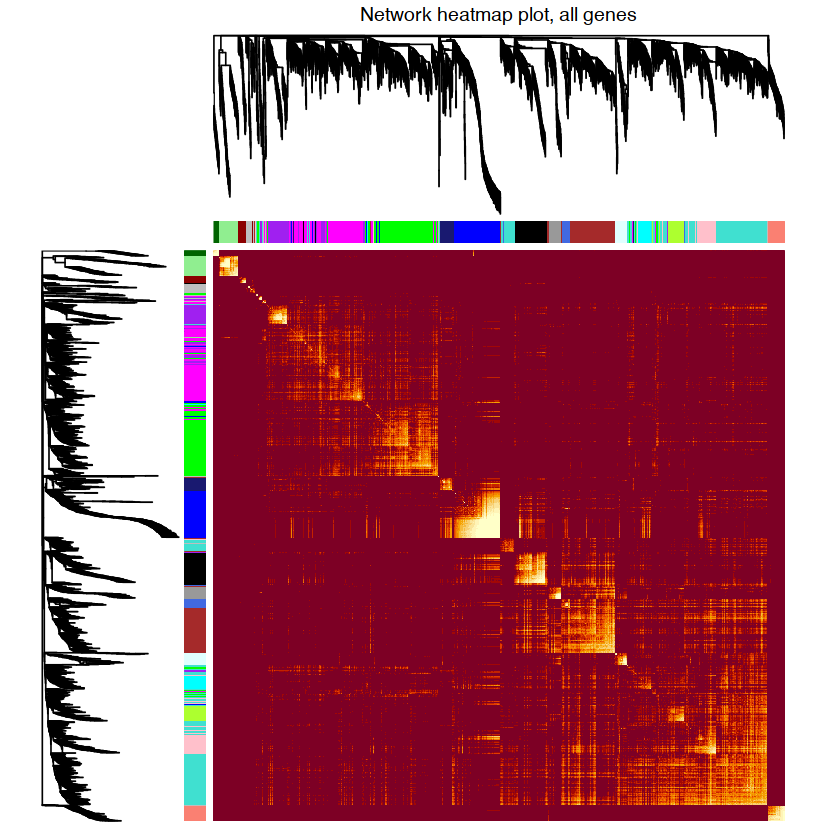

In [109]:
dissTOM = 1-TOMsimilarityFromExpr(datExpr, power = 6);
# Transform dissTOM with a power to make moderately strong connections more visible in the heatmap
plotTOM = dissTOM^7;
# Set diagonal to NA for a nicer plot
diag(plotTOM) = NA;
# Call the plot function
#sizeGrWindow(9,9)
TOMplot(plotTOM, geneTree, moduleColors, main = "Network heatmap plot, all genes")

计算网络亚集并可视化

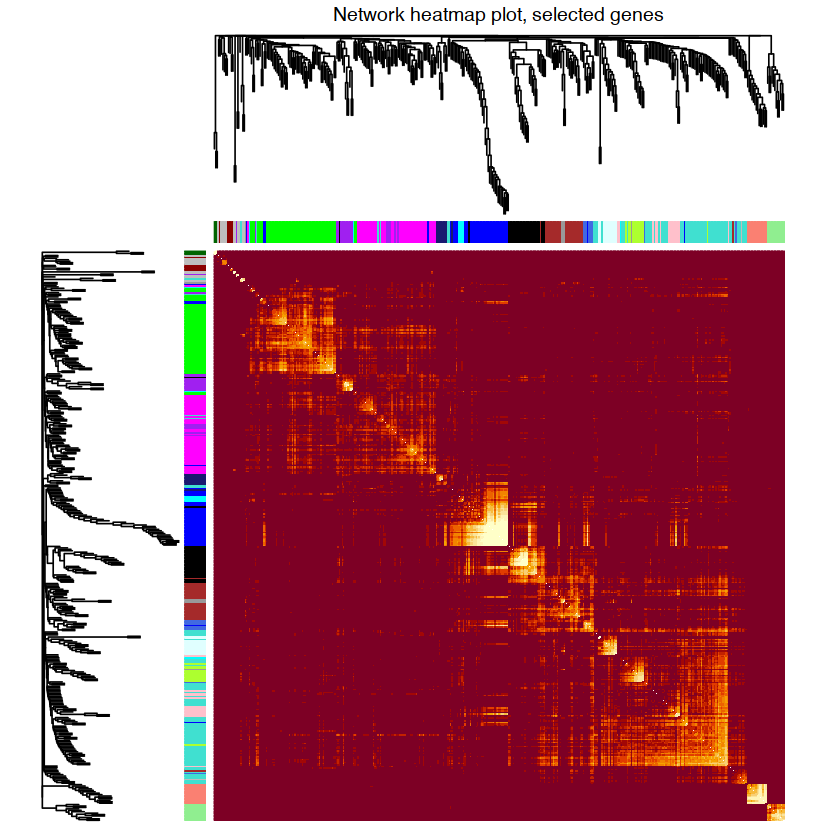

In [112]:
nSelect = 400
# For reproducibility, we set the random seed
set.seed(10);
select = sample(nGenes, size = nSelect);
selectTOM = dissTOM[select, select];
# There's no simple way of restricting a clustering tree to a subset of genes, so we must re-cluster.
selectTree = hclust(as.dist(selectTOM), method = "average")
selectColors = moduleColors[select];
# Open a graphical window
#sizeGrWindow(9,9)
# Taking the dissimilarity to a power, say 10, makes the plot more informative by effectively changing 
# the color palette; setting the diagonal to NA also improves the clarity of the plot
plotDiss = selectTOM^7;
diag(plotDiss) = NA;
TOMplot(plotDiss, selectTree, selectColors, main = "Network heatmap plot, selected genes")

### 1.4.b 可视化网络特征基因

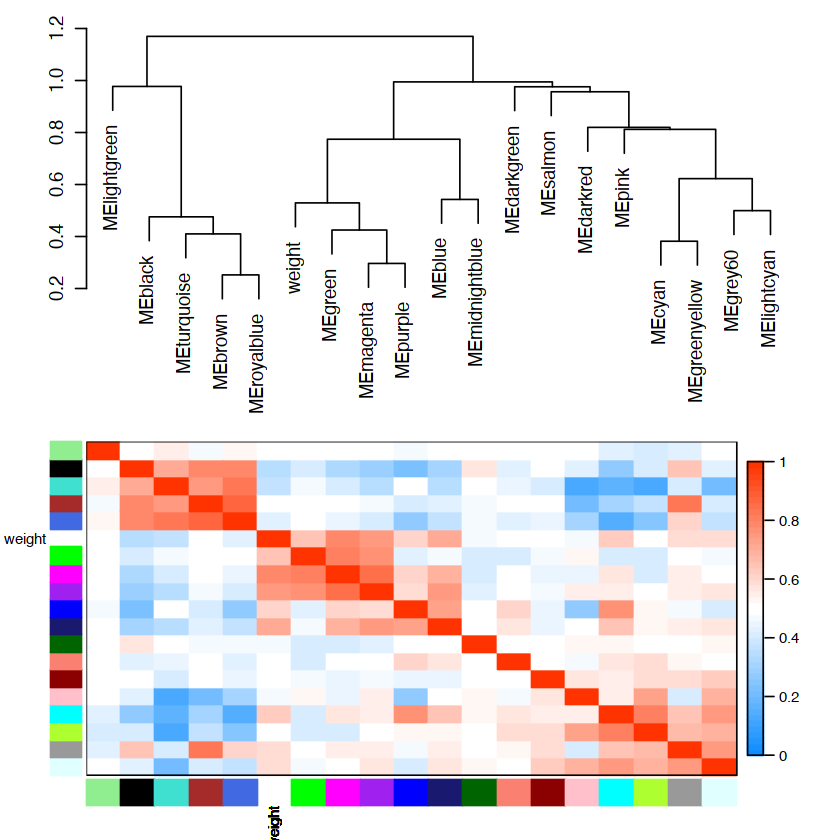

In [114]:
# Recalculate module eigengenes
MEs = moduleEigengenes(datExpr, moduleColors)$eigengenes
# Isolate weight from the clinical traits
weight = as.data.frame(datTraits$weight_g);
names(weight) = "weight"
# Add the weight to existing module eigengenes
MET = orderMEs(cbind(MEs, weight))
# Plot the relationships among the eigengenes and the trait
#sizeGrWindow(5,7.5);
par(cex = 0.9)
plotEigengeneNetworks(MET, "", marDendro = c(0,4,1,2), marHeatmap = c(3,4,1,2), cex.lab = 0.8, xLabelsAngle
= 90)

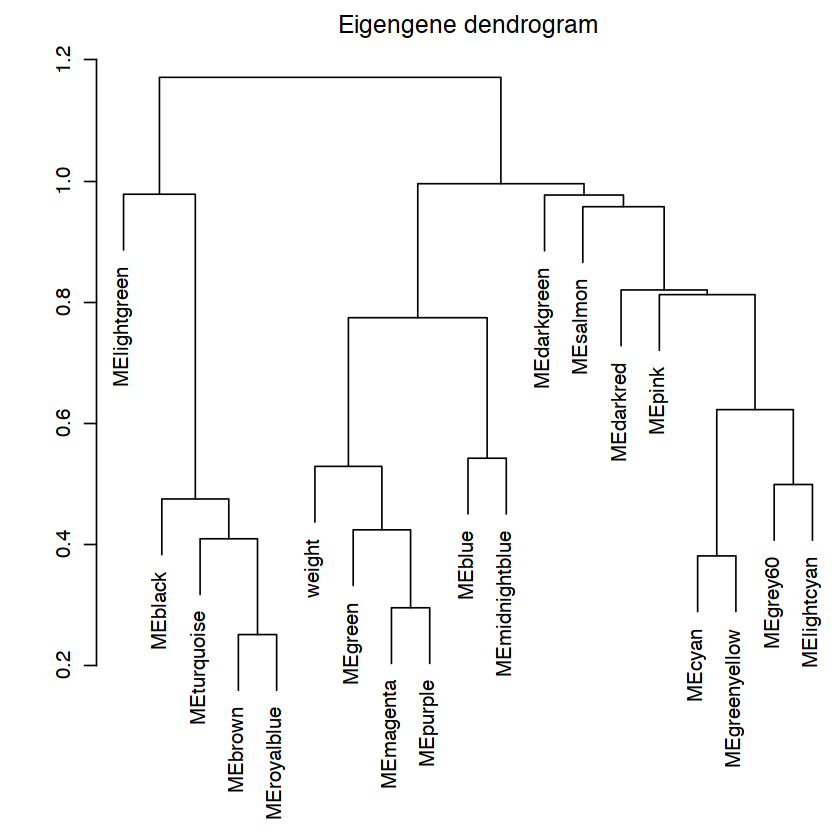

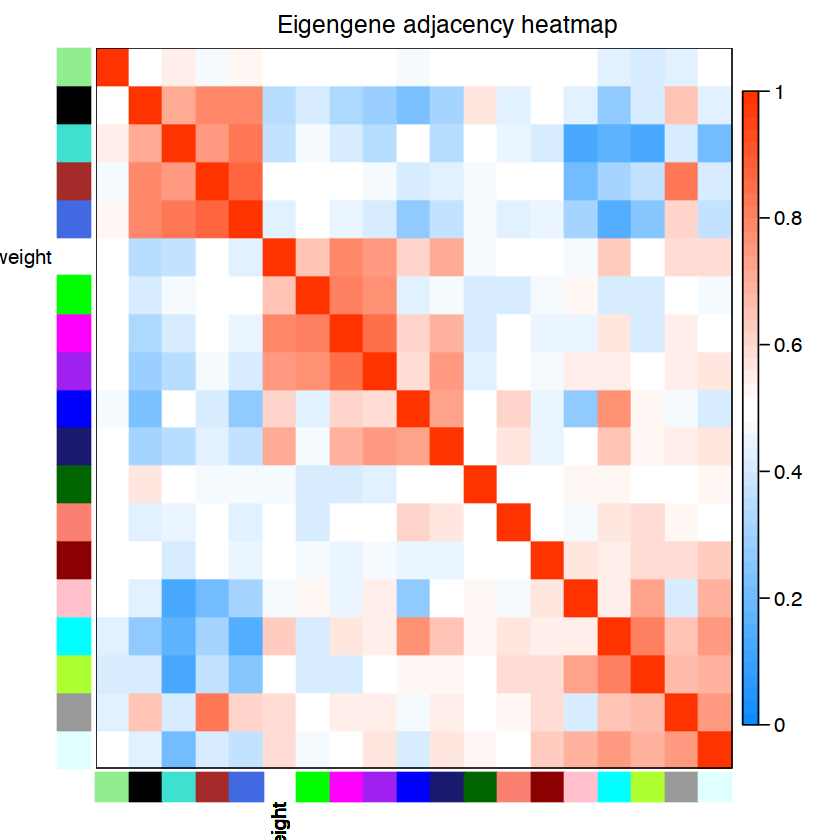

In [116]:
# Plot the dendrogram
#sizeGrWindow(6,6);
par(cex = 1.0)
plotEigengeneNetworks(MET, "Eigengene dendrogram", marDendro = c(0,4,2,0),
                      plotHeatmaps = FALSE)
# Plot the heatmap matrix (note: this plot will overwrite the dendrogram plot)
par(cex = 1.0)
plotEigengeneNetworks(MET, "Eigengene adjacency heatmap", marHeatmap = c(3,4,2,2),
                      plotDendrograms = FALSE, xLabelsAngle = 90)

## 1.6 将网络图导出
我比较喜欢导出点和边，导出两个文件

In [119]:
# Recalculate topological overlap if needed
TOM = TOMsimilarityFromExpr(datExpr, power = 6);
# Read in the annotation file
annot = read.csv(file = "../data/GeneAnnotation.csv");
# Select modules
modules = c("brown", "red");
# Select module probes
probes = names(datExpr)
inModule = is.finite(match(moduleColors, modules));
modProbes = probes[inModule];
modGenes = annot$gene_symbol[match(modProbes, annot$substanceBXH)];
# Select the corresponding Topological Overlap
modTOM = TOM[inModule, inModule];
dimnames(modTOM) = list(modProbes, modProbes)
# Export the network into edge and node list files Cytoscape can read
cyt = exportNetworkToCytoscape(modTOM,
  edgeFile = paste("../data/CytoscapeInput-edges-", paste(modules, collapse="-"), ".txt", sep=""),
  nodeFile = paste("../data/CytoscapeInput-nodes-", paste(modules, collapse="-"), ".txt", sep=""),
  weighted = TRUE,
  threshold = 0.02,
  nodeNames = modProbes,
  altNodeNames = modGenes,
  nodeAttr = moduleColors[inModule]);

TOM calculation: adjacency..
..will use 11 parallel threads.
 Fraction of slow calculations: 0.383698
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
